In [1]:
import torch
import numpy as np
import pandas as pd
import anndata as ad
import multiDGD
import random

# print directory
import os
print(os.getcwd())
os.chdir("../..")
print(os.getcwd())

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

/home/dbm829/.conda/envs/sc_mechinterp/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/home/dbm829/projects/interpreting_omics_models/02_experiments/notebooks
/home/dbm829/projects/interpreting_omics_models


In [2]:
# set a random seed

seed = 0

torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

In [3]:
data = ad.read_h5ad('./01_data/human_bonemarrow.h5ad')

In [73]:
# load model from the saved checkpoint
# models are automaticallt saved after training

model = multiDGD.DGD.load(data=data, save_dir='./03_results/models/', model_name='human_bonemarrow_l20_h2-3_test50e')

Covariate model initialized as:

        Gaussian_mix_compture:
            Dimensionality: 2
            Number of components: 4
        
#######################
Training status
#######################
True


In [5]:
reps = model.representation.z.detach()

In [5]:
data.obs.columns

Index(['GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors',
       'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments',
       'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction',
       'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order',
       'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality',
       'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType',
       'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker',
       'train_val_test', 'observable', 'covariate_Site'],
      dtype='object')

### utils

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim

# Sparse Autoencoder Model with Mechanistic Interpretability
class SparseAutoencoder(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(SparseAutoencoder, self).__init__()
        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU()
        )
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(hidden_size, input_size),
            #nn.Sigmoid()
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded, encoded

# Mechanistic Loss Function for Sparsity and Interpretability
def loss_function(reconstructed, original, encoded, weights, sparsity_penalty, l1_weight):
    # Reconstruction loss (MSE)
    mse_loss = nn.MSELoss()(reconstructed, original)
    
    # L1 regularization for encoded activations (promotes sparsity in the hidden layer)
    l1_loss = l1_weight * torch.mean(torch.abs(encoded))

    # Weight sparsity (to promote interpretable features in the weights)
    weight_sparsity_loss = sparsity_penalty * torch.sum(torch.abs(weights))

    # Combined loss
    total_loss = mse_loss + l1_loss + weight_sparsity_loss
    return total_loss

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_obs_activations(obs, activations, unique_ids):
    obs_vals = np.unique(data.obs[obs].values)

    means = np.zeros((len(obs_vals), len(unique_ids)))

    for i, ct in enumerate(obs_vals):
        ids_ct = np.where(data.obs[obs] == ct)[0]
        activations_ct = activations[ids_ct,:].detach().cpu().numpy()
        avg_activations = np.mean(activations_ct, axis=0)
        means[i, :] = avg_activations[unique_ids]
        del activations_ct
        del avg_activations

    df_means = pd.DataFrame(means, index=obs_vals, columns=unique_ids)

    sns.heatmap(df_means, cmap='rocket_r')
    plt.title(f'Mean activations: {obs}')
    plt.xlabel('Hidden unit')
    plt.ylabel(obs)
    plt.show()

def plot_activation_range(data, activations, range_start_end=None, indices=None, obs=None, plot_size=(10,10), obs_order=None):

    if range_start_end is not None:
        activs = activations[:, range_start_end[0]:range_start_end[1]].detach().cpu().numpy()
    elif indices is not None:
        activs = activations[:, indices].detach().cpu().numpy()
    else:
        activs = activations.detach().cpu().numpy()

    if obs is not None:
        # sort by obs
        if range_start_end is not None:
            df_temp = pd.DataFrame(activs, columns=range(range_start_end[0], range_start_end[1]))
        elif indices is not None:
            df_temp = pd.DataFrame(activs, columns=indices)
        else:
            df_temp = pd.DataFrame(activs, columns=range(activs.shape[1]))
        df_temp['obs'] = data.obs[obs].values
        df_temp.index = data.obs[obs].values
        if obs_order is not None:
            df_temp['obs'] = pd.Categorical(df_temp['obs'], categories=obs_order, ordered=True)
        df_temp = df_temp.sort_values(by='obs')

        fig, ax = plt.subplots(figsize=plot_size)
        sns.heatmap(df_temp.drop(columns='obs'), cmap='rocket_r')
        if range_start_end is not None:
            plt.title(f'Activations for range {range_start_end[0]}-{range_start_end[1]}')
        else:
            plt.title(f'Activations')
        plt.xlabel('Hidden unit')
        plt.ylabel(obs)
        plt.show()
    else:
        fig, ax = plt.subplots(figsize=plot_size)
        sns.heatmap(activs, cmap='rocket_r')
        if range_start_end is not None:
            plt.title(f'Activations for range {range_start_end[0]}-{range_start_end[1]}')
        else:
            plt.title(f'Activations')
        plt.xlabel('Hidden unit')
        plt.show()

import torch

# Function to get the unique indices of active hidden units across all samples
def get_unique_active_unit_indices(model, data_loader, threshold=1e-5):
    unique_active_indices = set()  # Use a set to store unique active neuron indices

    # Set the model to evaluation mode
    model.eval()

    with torch.no_grad():  # Disable gradient calculations for efficiency
        for data in data_loader:
            inputs = data
            
            # Forward pass through the encoder to get the hidden layer activations
            _, encoded = model(inputs)
            
            # Find the indices of the active neurons (where activation > threshold)
            active_indices_batch = (encoded > threshold).nonzero(as_tuple=False)  # Get nonzero indices

            # This returns indices in the form [batch_idx, neuron_idx]
            # We are only interested in neuron_idx for overall unique active units
            unique_active_indices.update(active_indices_batch[:, 1].tolist())

    # Convert to sorted list for convenience
    unique_active_indices = sorted(unique_active_indices)

    return unique_active_indices

# Assuming 'model' is your trained SparseAutoencoder and 'data_loader' is your dataset loader
def count_active_hidden_units(model, data_loader, threshold=1e-5):
    total_active_units = 0
    total_samples = 0

    # Set the model to evaluation mode
    model.eval()

    with torch.no_grad():  # Disable gradient calculations for efficiency
        for data in data_loader:
            inputs = data
            
            # Forward pass through the encoder to get the hidden layer activations
            _, encoded = model(inputs)
            
            # Count how many activations are above the threshold (active neurons)
            active_units_per_sample = (encoded > threshold).sum(dim=1)
            
            # Sum over all samples
            total_active_units += active_units_per_sample.sum().item()
            total_samples += inputs.size(0)

    # Calculate the average number of active units per sample
    avg_active_units = total_active_units / total_samples
    return avg_active_units

from scipy.signal import find_peaks

def detect_valleys(activations, individual_activation):
    # Compute histogram (adjust bins as necessary)
    hist_values, bin_edges = np.histogram(activations[:, individual_activation].detach().cpu().numpy(), bins=100)
    
    # Get bin centers (midpoints of bin edges)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Invert the histogram to find valleys (local minima)
    inverted_hist = -hist_values

    # Find peaks in the inverted histogram (which correspond to valleys in the original histogram)
    valley_indices, _ = find_peaks(inverted_hist, distance=5)  # Adjust distance based on expected group separations

    # Get the bin center values corresponding to the valleys
    valley_positions = bin_centers[valley_indices]

    return valley_positions

Epoch [1/500], Loss: 0.01749228
Epoch [2/500], Loss: 0.00369312
Epoch [3/500], Loss: 0.00355134
Epoch [4/500], Loss: 0.00335182
Epoch [5/500], Loss: 0.00317478
Epoch [6/500], Loss: 0.00310442
Epoch [7/500], Loss: 0.00304562
Epoch [8/500], Loss: 0.00299208
Epoch [9/500], Loss: 0.00296422
Epoch [10/500], Loss: 0.00294038
Epoch [11/500], Loss: 0.00291575
Epoch [12/500], Loss: 0.00289199
Epoch [13/500], Loss: 0.00286739
Epoch [14/500], Loss: 0.00284576
Epoch [15/500], Loss: 0.00282714
Epoch [16/500], Loss: 0.00281045
Epoch [17/500], Loss: 0.00279528
Epoch [18/500], Loss: 0.00278512
Epoch [19/500], Loss: 0.00277645
Epoch [20/500], Loss: 0.00276972
Epoch [21/500], Loss: 0.00276175
Epoch [22/500], Loss: 0.00275529
Epoch [23/500], Loss: 0.00274881
Epoch [24/500], Loss: 0.00274538
Epoch [25/500], Loss: 0.00273866
Epoch [26/500], Loss: 0.00273223
Epoch [27/500], Loss: 0.00272682
Epoch [28/500], Loss: 0.00272322
Epoch [29/500], Loss: 0.00272075
Epoch [30/500], Loss: 0.00271443
Epoch [31/500], Los

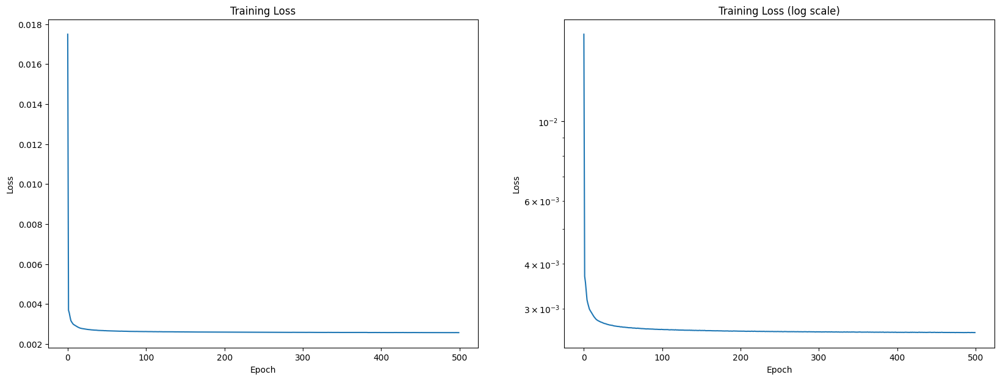

In [61]:
# Hyperparameters
input_size = reps.shape[1]  # Number of input neurons
hidden_size = input_size * 100
learning_rate = 1e-3
num_epochs = 500
batch_size = 128
sparsity_penalty = 1e-5  # Weight for weight sparsity
l1_weight = 1e-3  # Weight for activation sparsity
#early_stopping = 10

# Load dataset (Replace with your own dataset)
# Example using random data, replace with actual dataset
train_data = reps.clone()
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)

# Initialize model
sae_model = SparseAutoencoder(input_size, hidden_size)
sae_model = sae_model.to(device)

# Optimizer
optimizer = optim.Adam(sae_model.parameters(), lr=learning_rate)

# Training loop
losses = []
for epoch in range(num_epochs):

    # early stopping if the last 10 epochs have not improved the loss
    #if len(losses) > early_stopping:
    #    if np.min(losses[-early_stopping:]) == losses[-early_stopping]:
    #        print(f'Early stopping at epoch {epoch + 1}')
    #        break
    
    total_loss = 0
    for x in train_loader:
        # Get inputs and convert to torch Variable
        inputs = x
        inputs = inputs.to(device)
        
        # Forward pass
        outputs, encoded = sae_model(inputs)
        
        # Compute loss
        loss = loss_function(
            outputs, 
            inputs, 
            encoded, 
            sae_model.encoder[0].weight,  # Pass the encoder's weights for weight sparsity
            sparsity_penalty, 
            l1_weight
        )
        
        # Backprop and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
    
    losses.append(total_loss / len(train_loader))
    
    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {total_loss / len(train_loader):.8f}')

print("Training complete.")

# plot loss curve (normal) and log_scaled
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(20, 7))
axs[0].plot(losses)
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Loss')
axs[0].set_title('Training Loss')
axs[1].plot(losses)
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss')
axs[1].set_title('Training Loss (log scale)')
axs[1].set_yscale('log')
plt.show()

/tmp/ipykernel_235875/661681877.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  reps_reconstructed, activations = sae_model(torch.tensor(reps, dtype=torch.float32).to(device))


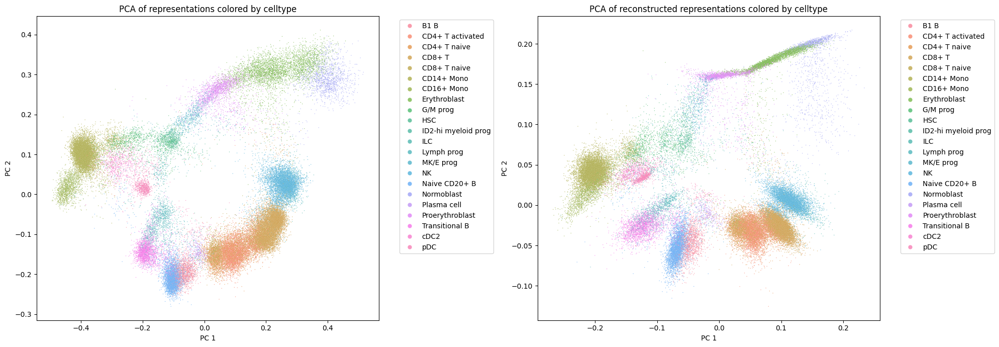

In [62]:
# create a pca of the reps
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

pca = PCA(n_components=2)
pca.fit(reps.cpu().numpy())
# plot the representations
reps_transformed = pca.transform(reps.cpu().numpy())

reps_reconstructed, activations = sae_model(torch.tensor(reps, dtype=torch.float32).to(device))
reps_reconstructed = reps_reconstructed.detach().cpu().numpy()
reps_reconstructed_transformed = pca.transform(reps_reconstructed)

# plot the pca
data = data[data.obs["train_val_test"] == "train"]

df_celltypes = pd.DataFrame(reps_transformed, columns=['PC 1', 'PC 2'])
df_celltypes['type'] = 'original'
df_celltypes['celltype'] = data.obs['cell_type'].values
df_temp = pd.DataFrame(reps_reconstructed_transformed, columns=['PC 1', 'PC 2'])
df_temp['type'] = 'reconstructed'
df_temp['celltype'] = data.obs['cell_type'].values
#df_celltypes = pd.concat([df_celltypes, df_temp])

fig, axs = plt.subplots(1, 2, figsize=(20, 7))

sns.scatterplot(data=df_celltypes, x='PC 1', y='PC 2', hue='celltype', ax=axs[0], s=1, alpha=0.7)
axs[0].set_title('PCA of representations colored by celltype')
axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)

sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='celltype', ax=axs[1], s=1, alpha=0.7)
axs[1].set_title('PCA of reconstructed representations colored by celltype')
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)

plt.tight_layout()
plt.show()

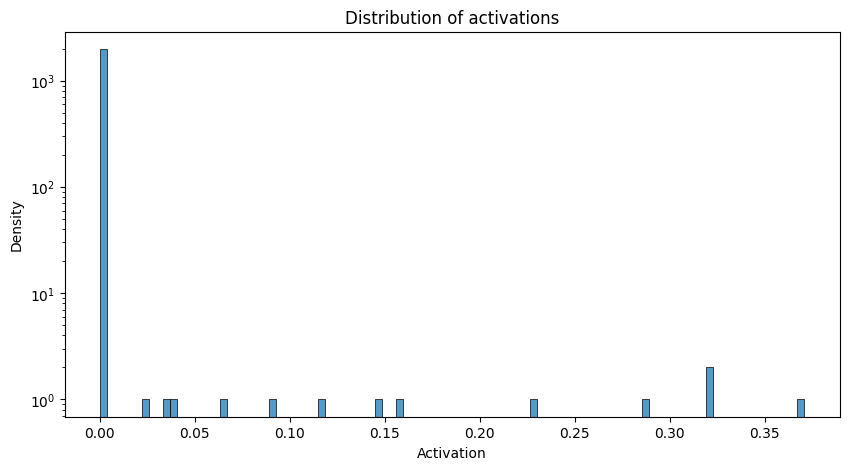

In [66]:
# plot the distributions of the activations
import seaborn as sns
import matplotlib.pyplot as plt

avg_activations = np.mean(activations.detach().cpu().numpy(), axis=0)
plt.figure(figsize=(10, 5))
sns.histplot(avg_activations, bins=100)
plt.yscale('log')
plt.title('Distribution of activations')
plt.xlabel('Activation')
plt.ylabel('Density')
plt.show()

In [75]:
unique_active_unit_indices = get_unique_active_unit_indices(sae_model, train_loader, threshold=1e-5)
print(f'Unique Active Neuron Indices: {unique_active_unit_indices}')

avg_active_hidden_units = count_active_hidden_units(sae_model, train_loader, threshold=1e-5)
print(f'Average number of active hidden units per sample: {avg_active_hidden_units:.2f}')

Unique Active Neuron Indices: [586, 648, 694, 851, 888, 889, 981, 1008, 1139, 1547, 1838, 1885, 1934]
Average number of active hidden units per sample: 12.13


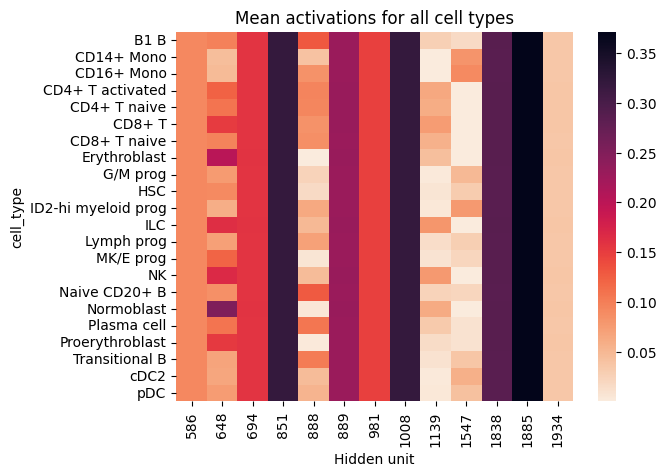

In [72]:
plot_obs_activations('cell_type', activations, unique_active_unit_indices)

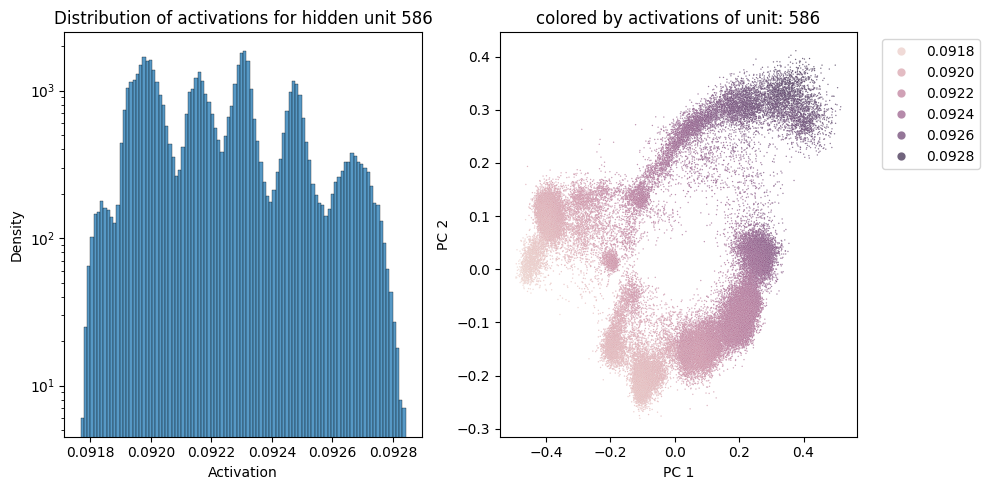

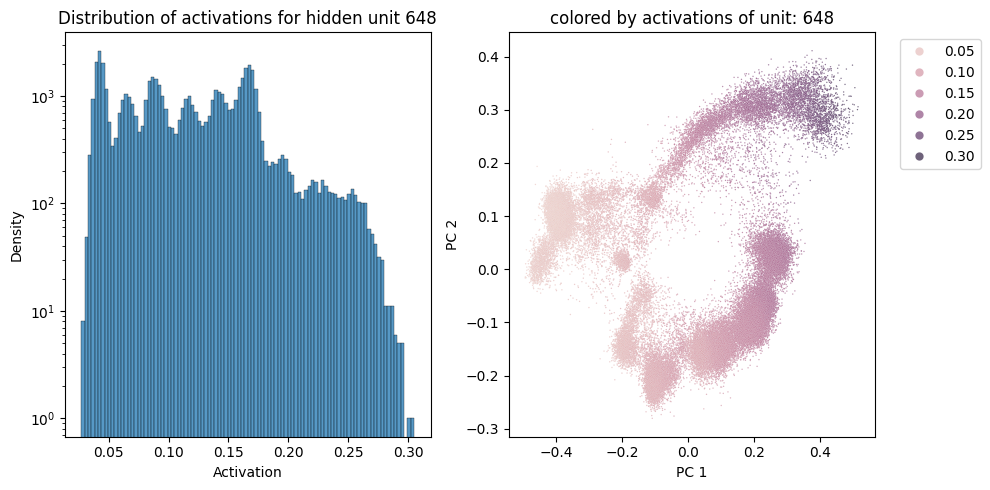

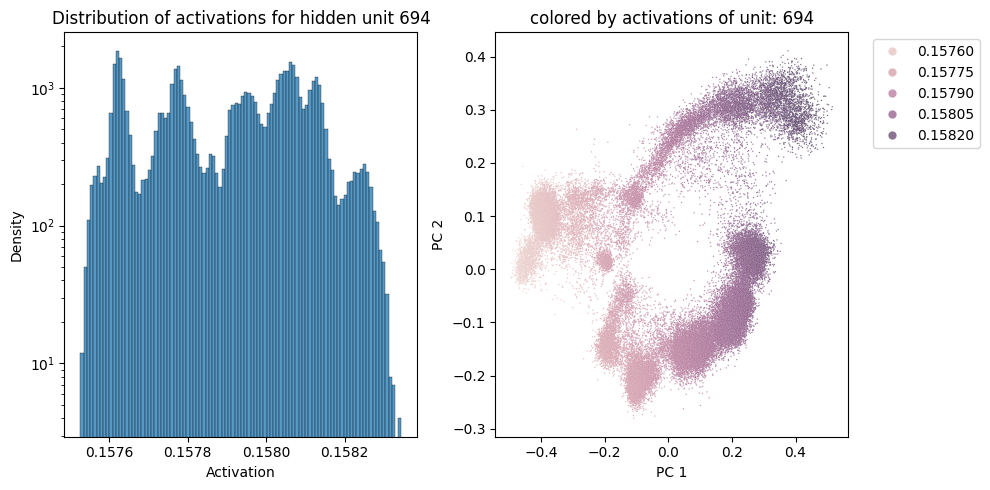

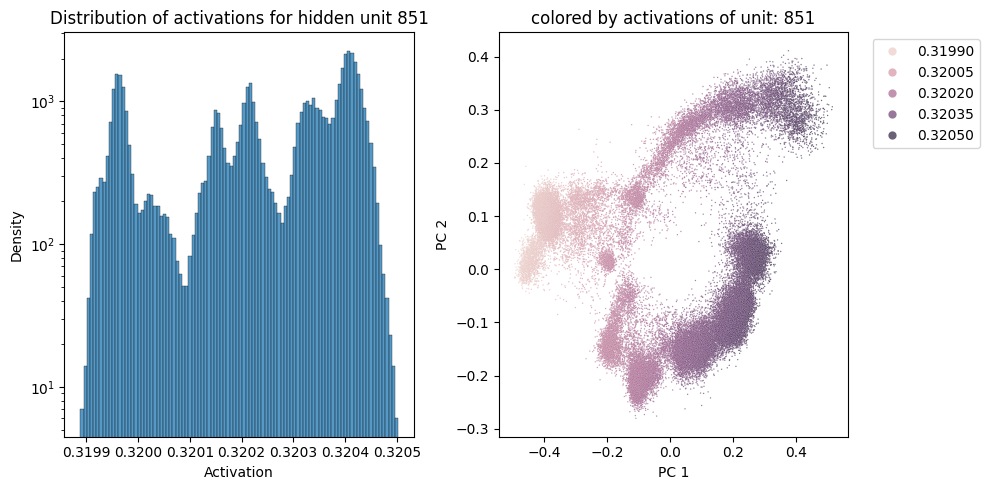

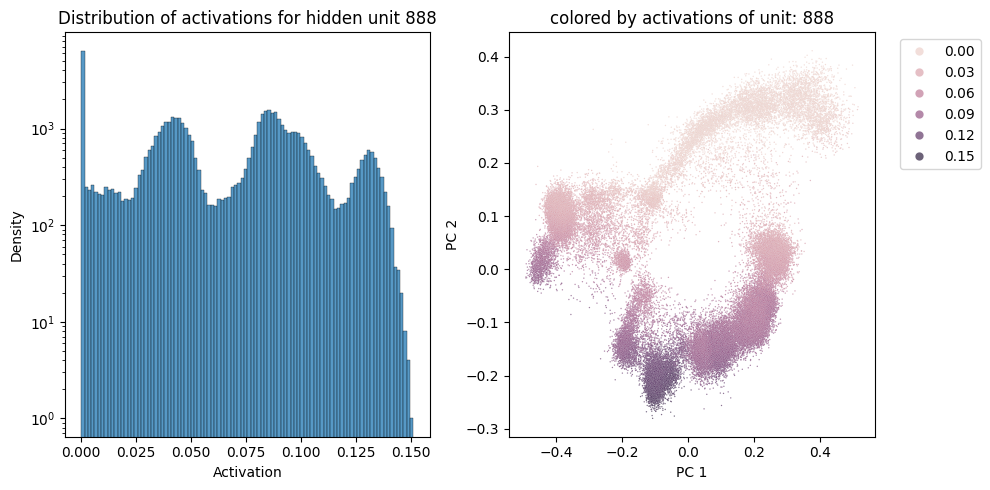

...

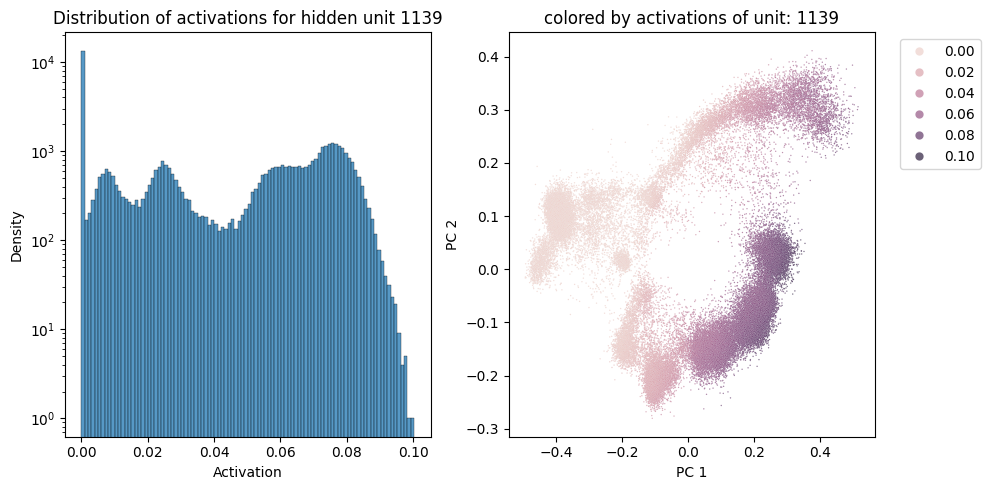

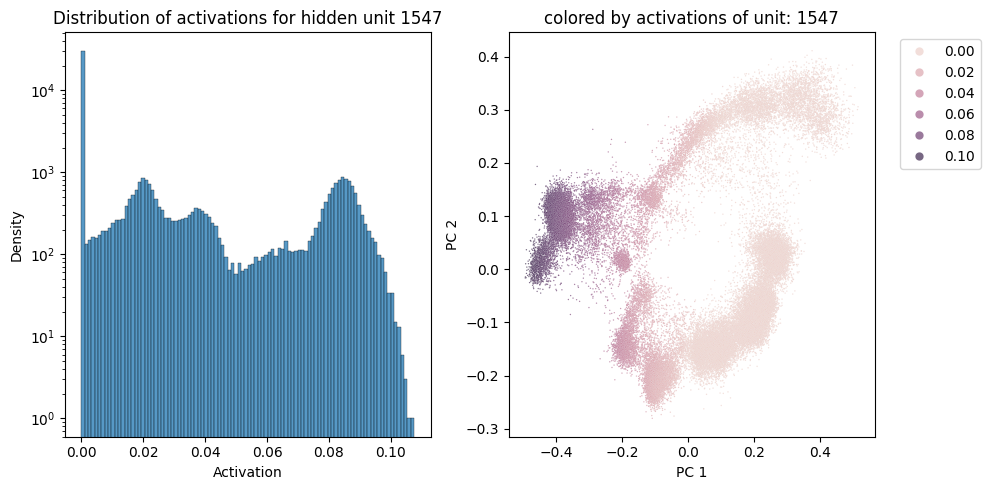

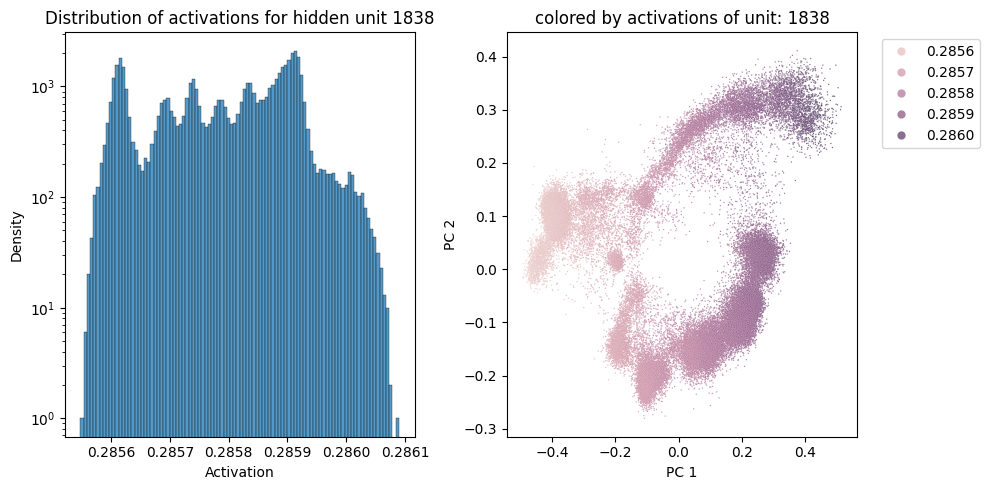

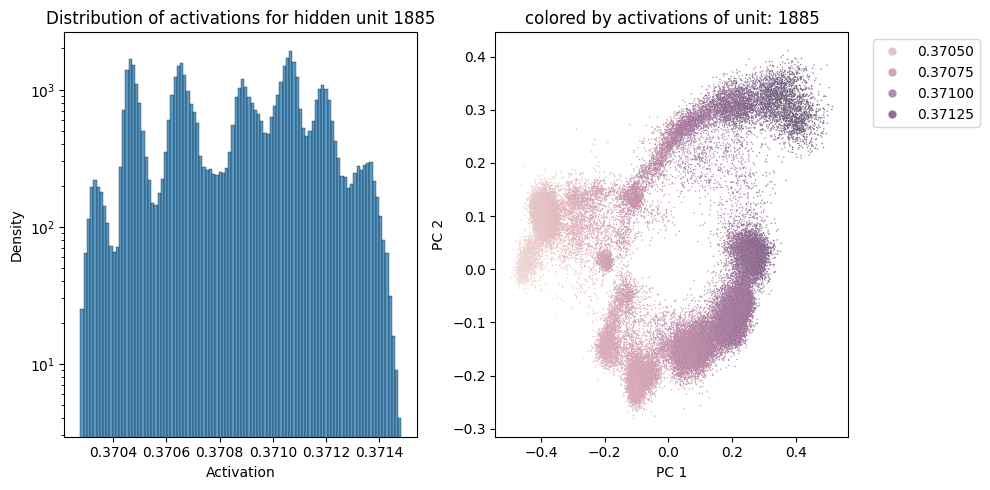

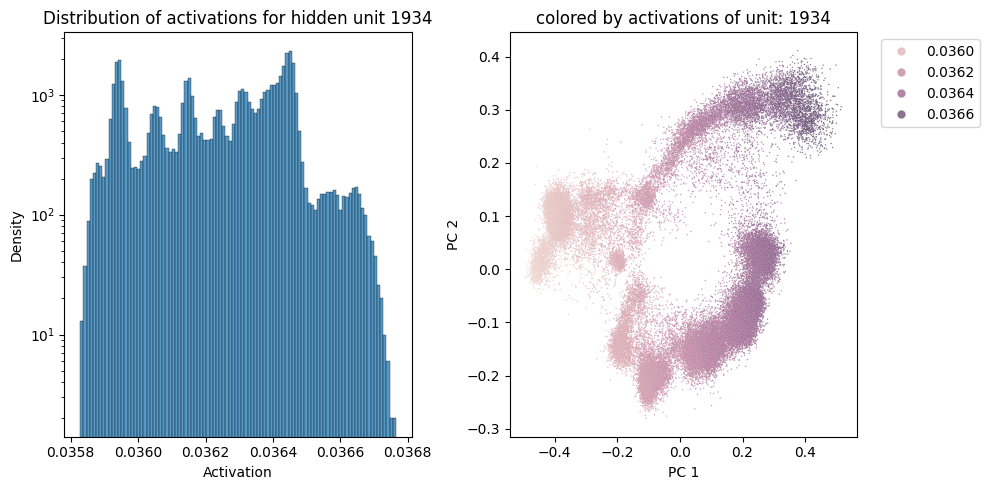

In [110]:
# for each of the active units, check which samples have them active
# also look at the distribution

for i, individual_activation in enumerate(unique_active_unit_indices):

    # make a figure with 3 columns and 1 row (I will use the first two columns for the histogram and the last one for the PCA)
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    #sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0:2])
    sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0])
    axs[0].set_yscale('log')
    axs[0].set_title(f'Distribution of activations for hidden unit {individual_activation}')
    axs[0].set_xlabel('Activation')
    axs[0].set_ylabel('Density')

    df_celltypes = pd.DataFrame(reps_transformed, columns=['PC 1', 'PC 2'])
    df_celltypes['activation'] = activations[:, individual_activation].detach().cpu().numpy()

    df_celltypes = df_celltypes.sort_values(by='activation', ascending=False)

    # plot the pca
    sns.scatterplot(data=df_celltypes, x='PC 1', y='PC 2', hue='activation', ax=axs[1], s=1, alpha=0.7)
    axs[1].set_title(f'colored by activations of unit: {individual_activation}')
    axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)

    plt.tight_layout()
    plt.show()

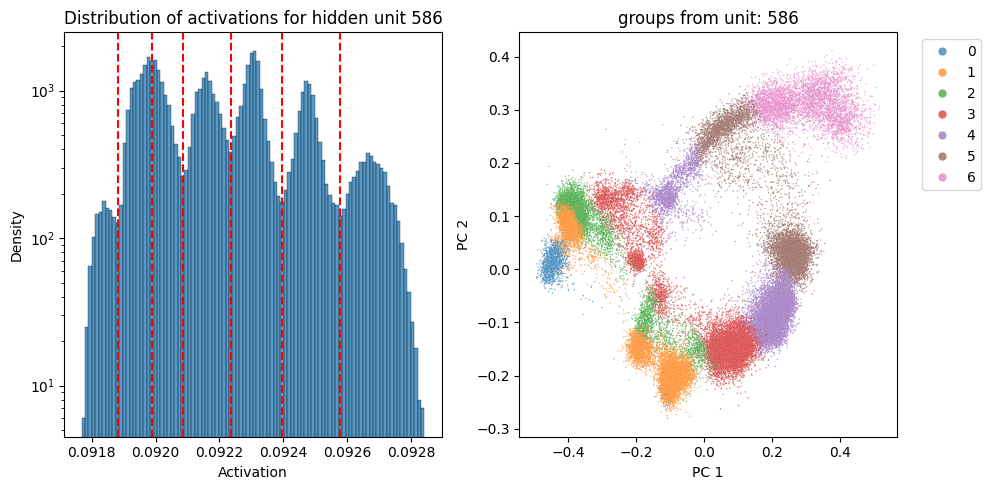

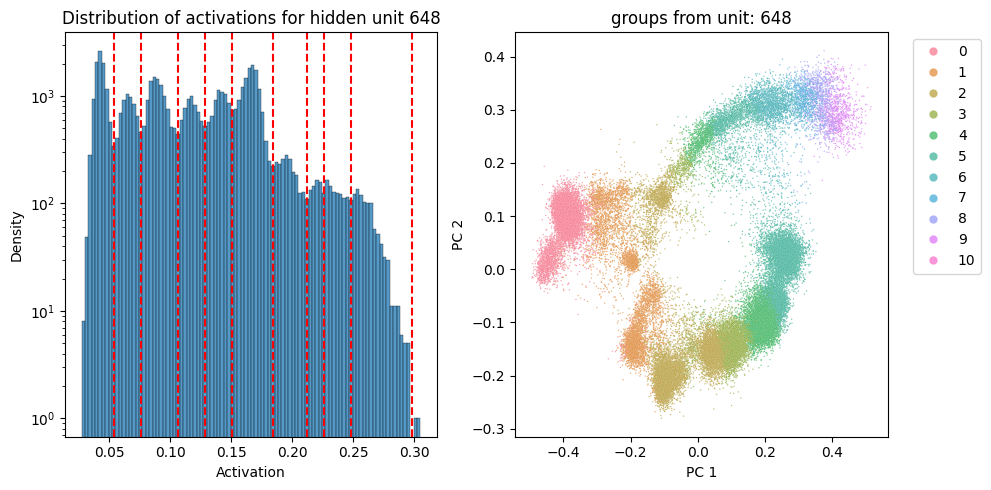

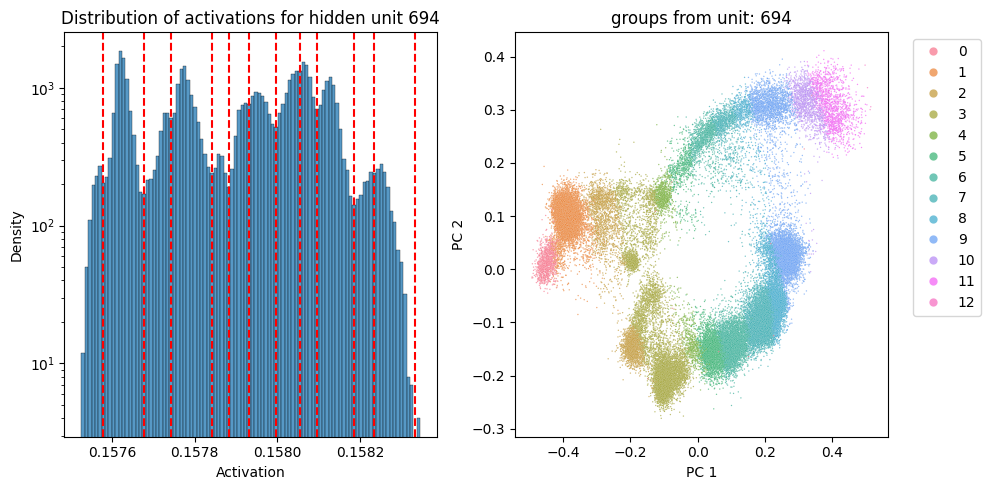

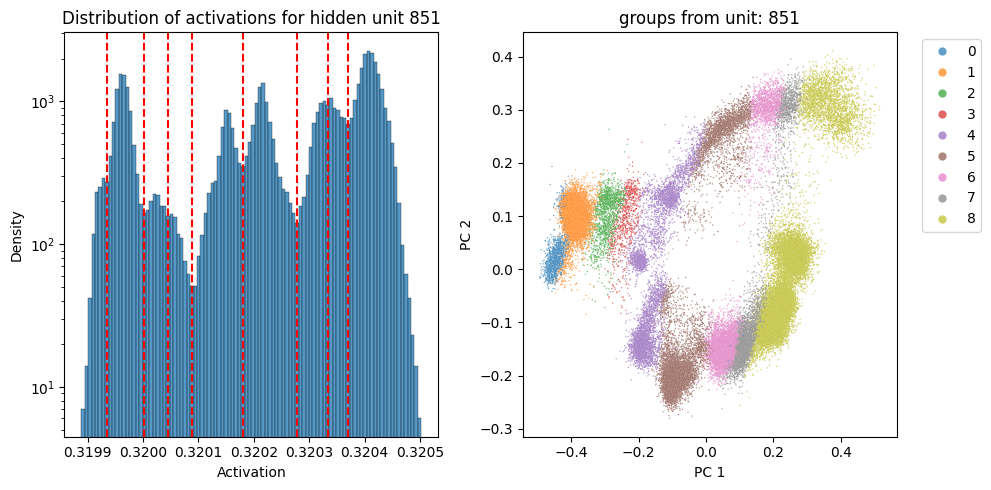

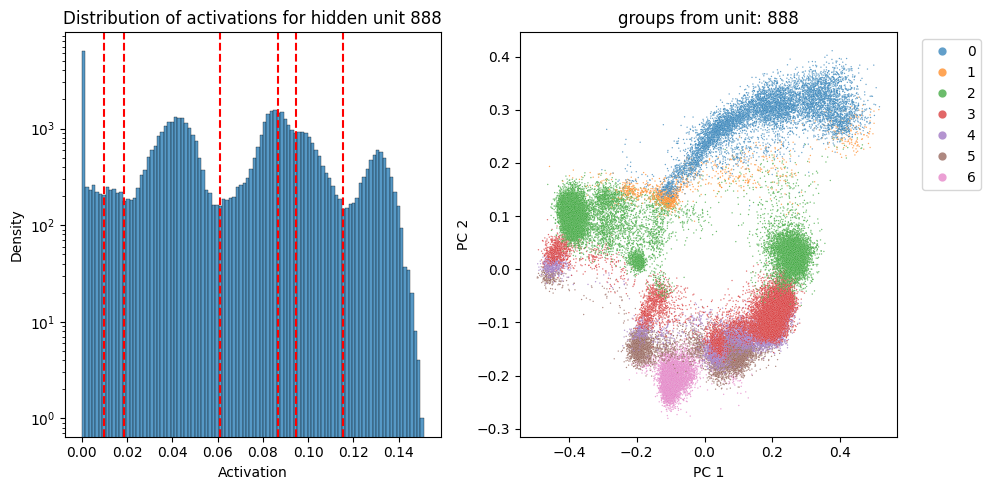

...

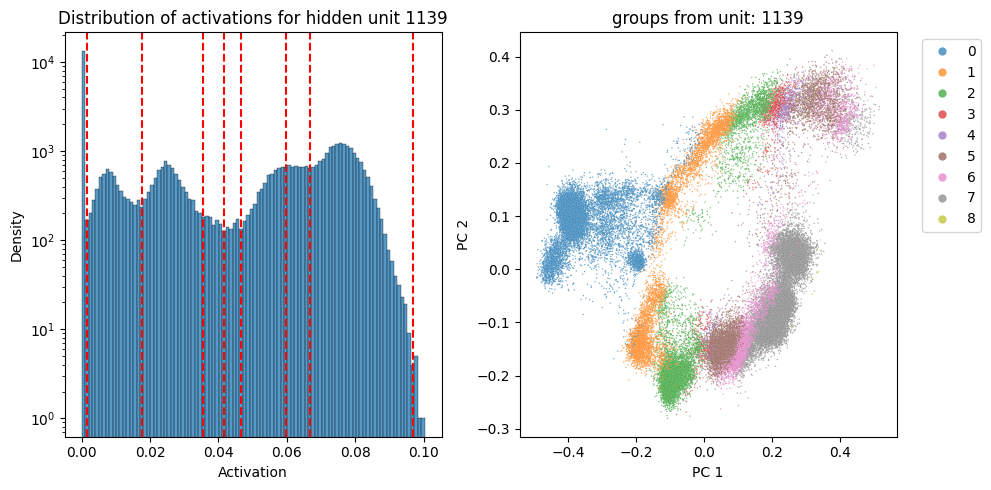

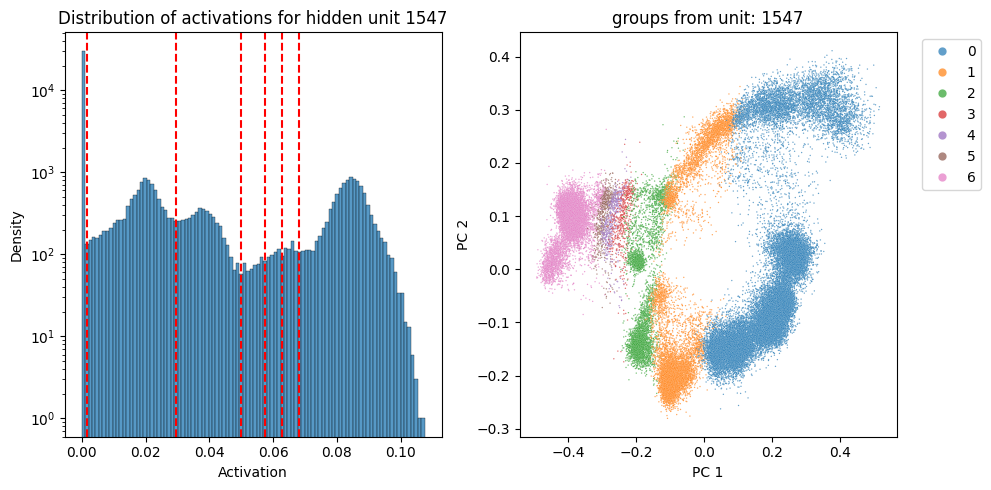

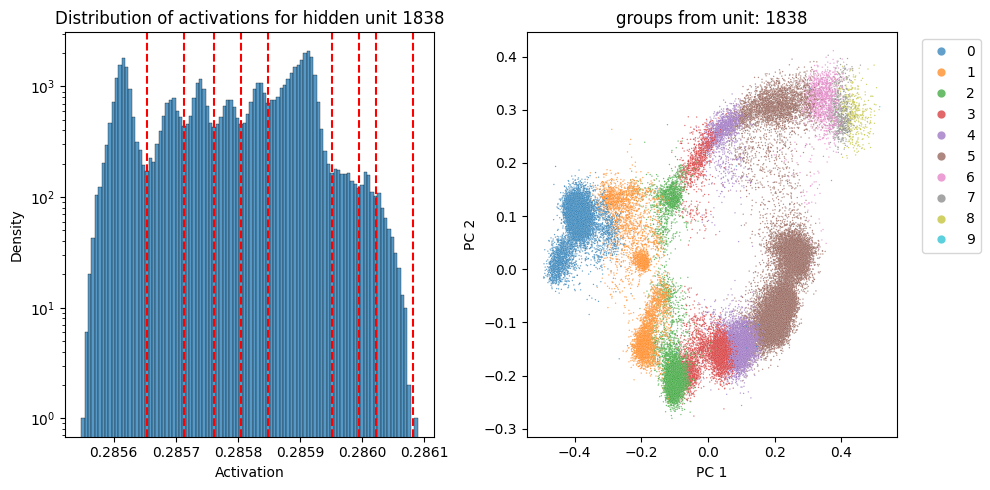

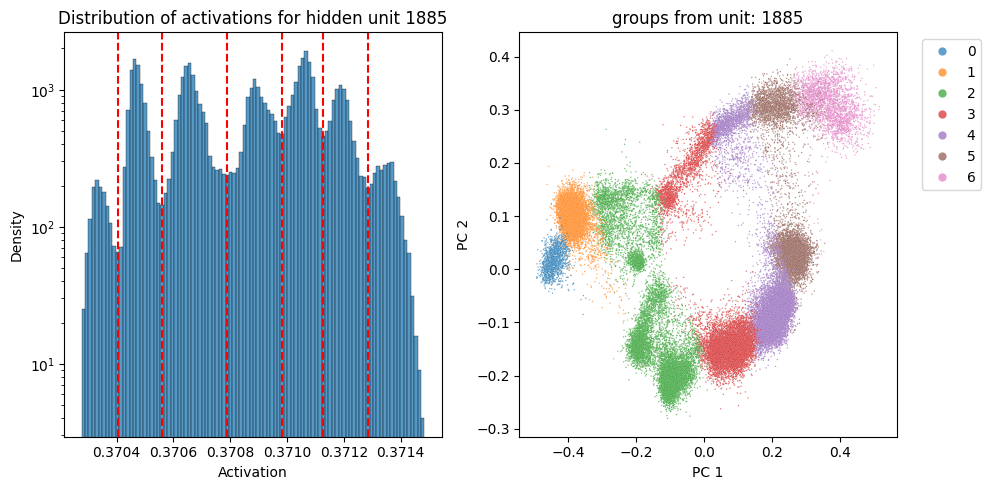

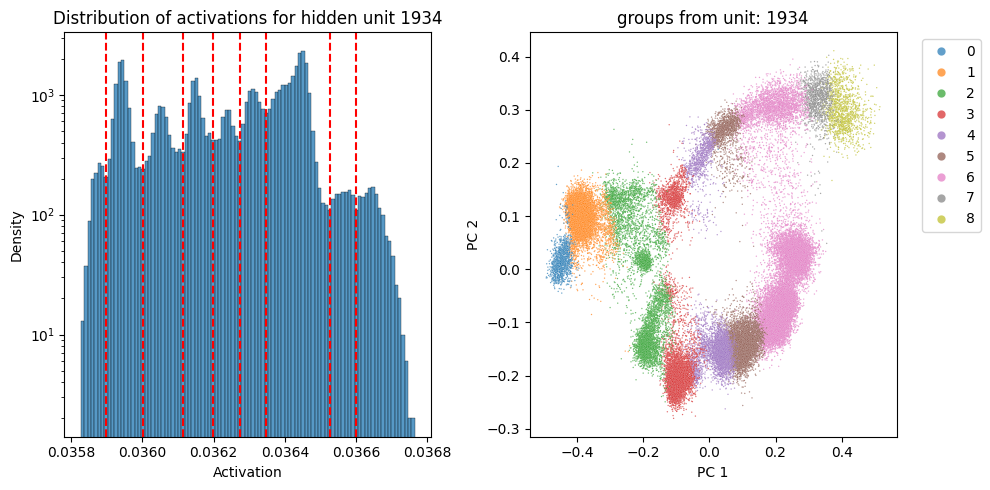

In [109]:
# for each of the active units, check which samples have them active
# also look at the distribution

for i, individual_activation in enumerate(unique_active_unit_indices):

    valleys = detect_valleys(activations, individual_activation)

    # make a figure with 3 columns and 1 row (I will use the first two columns for the histogram and the last one for the PCA)
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    #sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0:2])
    sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0])
    axs[0].set_yscale('log')
    for separator in valleys:
        axs[0].axvline(separator, color='red', linestyle='--')
    axs[0].set_title(f'Distribution of activations for hidden unit {individual_activation}')
    axs[0].set_xlabel('Activation')
    axs[0].set_ylabel('Density')

    df_celltypes = pd.DataFrame(reps_transformed, columns=['PC 1', 'PC 2'])
    df_celltypes['group'] = 0

    starting_line = 0
    for j, separator in enumerate(valleys):
        ids = (activations[:, individual_activation] < separator) & (activations[:, individual_activation] > starting_line)
        ids = ids.detach().cpu().numpy()
        starting_line = separator
        df_celltypes['group'].values[ids] = j
    ids = activations[:, individual_activation] >= separator
    ids = ids.detach().cpu().numpy()
    df_celltypes['group'].values[ids] = j + 1
    df_celltypes['group'] = df_celltypes['group'].astype('category')

    df_celltypes = df_celltypes.sort_values(by='group', ascending=False)

    # plot the pca
    sns.scatterplot(data=df_celltypes, x='PC 1', y='PC 2', hue='group', ax=axs[1], s=1, alpha=0.7)
    axs[1].set_title(f'groups from unit: {individual_activation}')
    axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)

    plt.tight_layout()
    plt.show()

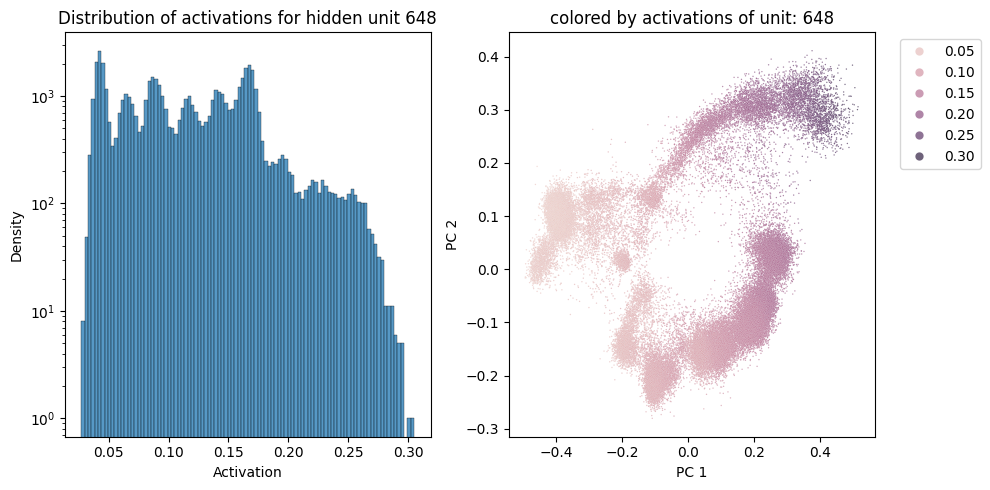

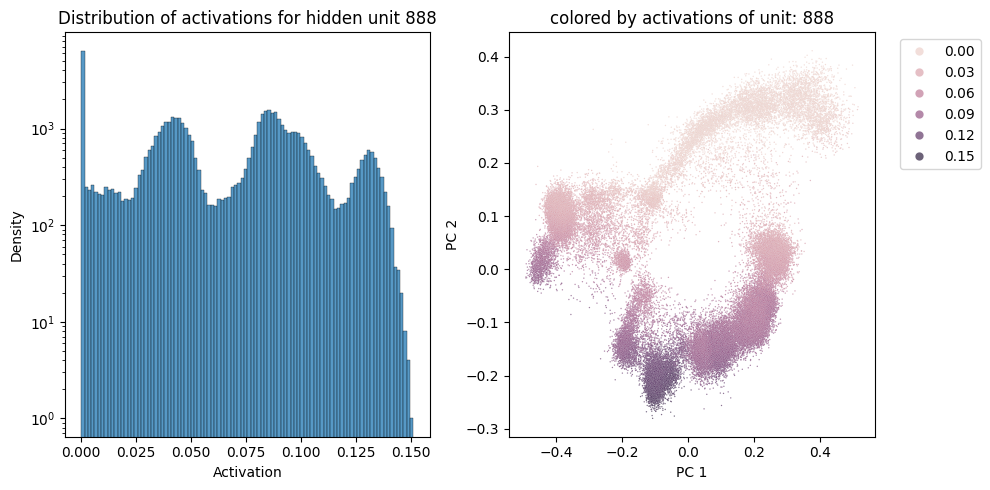

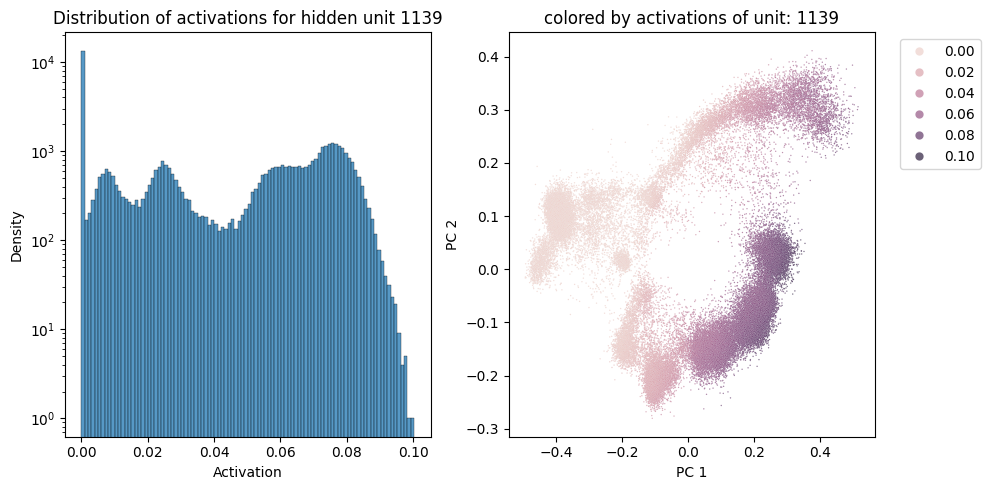

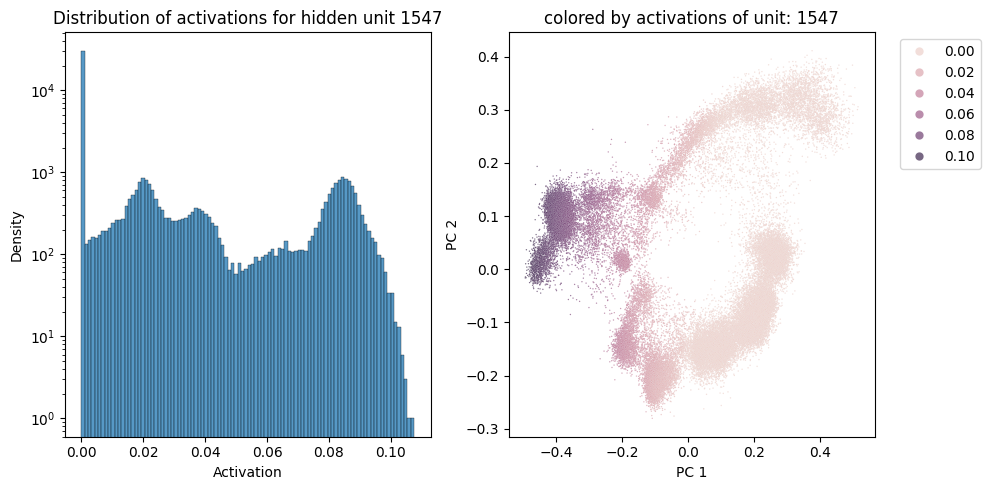

In [111]:
units_of_interest = [648, 888, 1139, 1547]

# for each of the active units, check which samples have them active
# also look at the distribution

for i, individual_activation in enumerate(units_of_interest):

    # make a figure with 3 columns and 1 row (I will use the first two columns for the histogram and the last one for the PCA)
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    #sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0:2])
    sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0])
    axs[0].set_yscale('log')
    axs[0].set_title(f'Distribution of activations for hidden unit {individual_activation}')
    axs[0].set_xlabel('Activation')
    axs[0].set_ylabel('Density')

    df_celltypes = pd.DataFrame(reps_transformed, columns=['PC 1', 'PC 2'])
    df_celltypes['activation'] = activations[:, individual_activation].detach().cpu().numpy()

    df_celltypes = df_celltypes.sort_values(by='activation', ascending=False)

    # plot the pca
    sns.scatterplot(data=df_celltypes, x='PC 1', y='PC 2', hue='activation', ax=axs[1], s=1, alpha=0.7)
    axs[1].set_title(f'colored by activations of unit: {individual_activation}')
    axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)

    plt.tight_layout()
    plt.show()

## 10**4 latents

### training

Epoch [1/500], Loss: 0.00018662
Epoch [2/500], Loss: 0.00006149
Epoch [3/500], Loss: 0.00005988
Epoch [4/500], Loss: 0.00005916
Epoch [5/500], Loss: 0.00005872
Epoch [6/500], Loss: 0.00005808
Epoch [7/500], Loss: 0.00005743
Epoch [8/500], Loss: 0.00005675
Epoch [9/500], Loss: 0.00005592
Epoch [10/500], Loss: 0.00005519
Epoch [11/500], Loss: 0.00005429
Epoch [12/500], Loss: 0.00005348
Epoch [13/500], Loss: 0.00005272
Epoch [14/500], Loss: 0.00005180
Epoch [15/500], Loss: 0.00005098
Epoch [16/500], Loss: 0.00005028
Epoch [17/500], Loss: 0.00004933
Epoch [18/500], Loss: 0.00004857
Epoch [19/500], Loss: 0.00004772
Epoch [20/500], Loss: 0.00004685
Epoch [21/500], Loss: 0.00004607
Epoch [22/500], Loss: 0.00004530
Epoch [23/500], Loss: 0.00004416
Epoch [24/500], Loss: 0.00004359
Epoch [25/500], Loss: 0.00004256
Epoch [26/500], Loss: 0.00004180
Epoch [27/500], Loss: 0.00004100
Epoch [28/500], Loss: 0.00004006
Epoch [29/500], Loss: 0.00003915
Epoch [30/500], Loss: 0.00003839
Epoch [31/500], Los

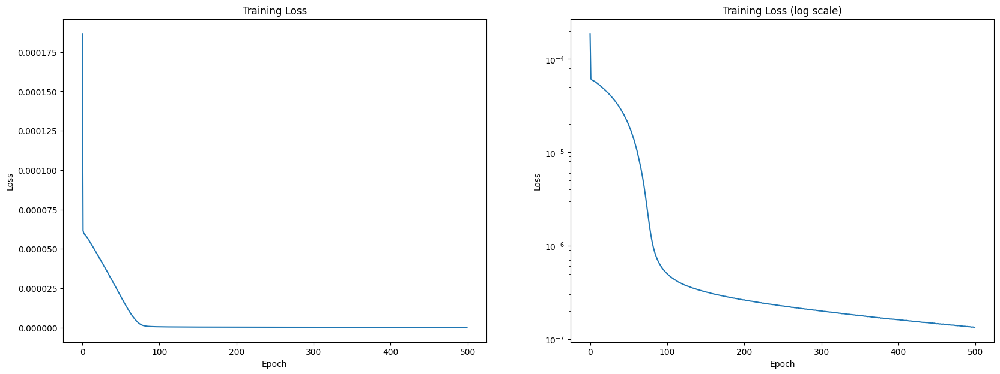

In [9]:
# Hyperparameters
input_size = reps.shape[1]  # Number of input neurons
hidden_size = 10**4
learning_rate = 1e-4
num_epochs = 500
batch_size = 128
sparsity_penalty = 0  # Weight for weight sparsity
l1_weight = 1e-3  # Weight for activation sparsity
#early_stopping = 10

# Load dataset (Replace with your own dataset)
# Example using random data, replace with actual dataset
train_data = reps.clone()
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)

# Initialize model
sae_model = SparseAutoencoder(input_size, hidden_size)
sae_model = sae_model.to(device)

# Optimizer
optimizer = optim.Adam(sae_model.parameters(), lr=learning_rate)

# Training loop
losses = []
for epoch in range(num_epochs):

    # early stopping if the last 10 epochs have not improved the loss
    #if len(losses) > early_stopping:
    #    if np.min(losses[-early_stopping:]) == losses[-early_stopping]:
    #        print(f'Early stopping at epoch {epoch + 1}')
    #        break
    
    total_loss = 0
    for x in train_loader:
        # Get inputs and convert to torch Variable
        inputs = x
        inputs = inputs.to(device)
        
        # Forward pass
        outputs, encoded = sae_model(inputs)
        
        # Compute loss
        loss = loss_function(
            outputs, 
            inputs, 
            encoded, 
            sae_model.encoder[0].weight,  # Pass the encoder's weights for weight sparsity
            sparsity_penalty, 
            l1_weight
        )
        
        # Backprop and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
    
    losses.append(total_loss / len(train_loader))
    
    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {total_loss / len(train_loader):.8f}')

print("Training complete.")

# plot loss curve (normal) and log_scaled
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(20, 7))
axs[0].plot(losses)
axs[0].set_xlabel('Epoch')
axs[0].set_ylabel('Loss')
axs[0].set_title('Training Loss')
axs[1].plot(losses)
axs[1].set_xlabel('Epoch')
axs[1].set_ylabel('Loss')
axs[1].set_title('Training Loss (log scale)')
axs[1].set_yscale('log')
plt.show()

In [18]:
# load the model
sae_model_save_name = '03_results/models/sae_model_10000_l1-1e-3_lr-1e-4_500epochs'

input_size = reps.shape[1]
hidden_size = 10**4
sae_model = SparseAutoencoder(input_size, hidden_size)
sae_model.load_state_dict(torch.load(sae_model_save_name+'.pt'))
sae_model.to(device)

batch_size = 128
train_data = reps.clone()
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)

In [10]:
# save the model
sae_model_save_name = '03_results/models/sae_model_10000_l1-1e-3_lr-1e-4_500epochs'
torch.save(sae_model.state_dict(), sae_model_save_name+'.pt')

### plot latents and avtivations over cell types

In [29]:
threshold = 1e-10

unique_active_unit_indices = get_unique_active_unit_indices(sae_model, train_loader, threshold=threshold)
print(f'Unique Active Neuron Indices: {unique_active_unit_indices}')
print(f'Number of unique active hidden units: {len(unique_active_unit_indices)}')

avg_active_hidden_units = count_active_hidden_units(sae_model, train_loader, threshold=threshold)
print(f'Average number of active hidden units per sample: {avg_active_hidden_units:.2f}')

Unique Active Neuron Indices: [2, 4, 5, 10, 11, 12, 13, 14, 16, 17, 20, 21, 22, 23, 24, 25, 26, 27, 30, 31, 32, 34, 36, 37, 38, 43, 45, 47, 48, 49, 50, 51, 54, 56, 59, 61, 64, 66, 67, 70, 71, 73, 75, 77, 80, 81, 82, 84, 85, 86, 87, 88, 89, 93, 94, 95, 97, 98, 99, 100, 101, 104, 106, 107, 109, 112, 114, 115, 117, 121, 122, 123, 124, 126, 127, 128, 129, 130, 131, 132, 137, 139, 140, 143, 144, 148, 149, 150, 152, 153, 154, 155, 156, 157, 158, 159, 160, 162, 165, 168, 172, 173, 174, 175, 178, 181, 182, 184, 188, 189, 190, 191, 192, 196, 198, 199, 201, 202, 204, 205, 206, 208, 209, 211, 212, 213, 214, 218, 220, 221, 222, 223, 224, 225, 227, 229, 237, 239, 240, 243, 246, 247, 249, 250, 251, 252, 254, 256, 261, 262, 263, 264, 265, 266, 268, 271, 272, 273, 274, 275, 278, 279, 281, 283, 284, 286, 289, 290, 291, 293, 298, 299, 302, 304, 306, 307, 309, 310, 312, 313, 314, 315, 316, 317, 320, 322, 324, 325, 326, 328, 330, 331, 335, 336, 337, 343, 346, 347, 348, 349, 350, 351, 352, 353, 355, 356, 3

/tmp/ipykernel_484192/661681877.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  reps_reconstructed, activations = sae_model(torch.tensor(reps, dtype=torch.float32).to(device))


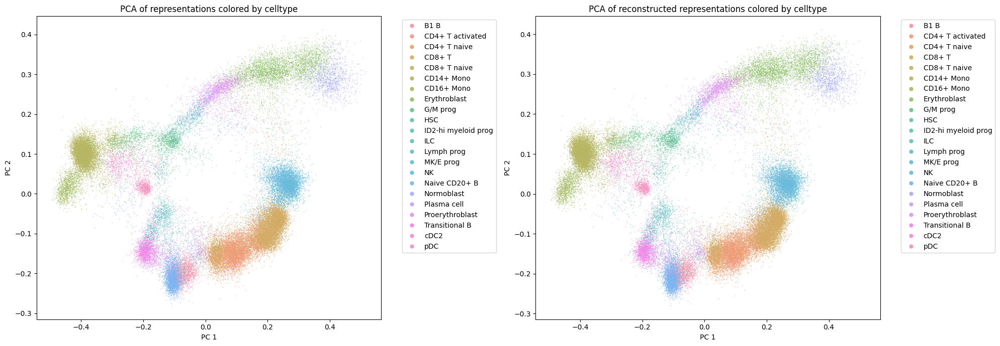

In [12]:
# create a pca of the reps
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

pca = PCA(n_components=2)
pca.fit(reps.cpu().numpy())
# plot the representations
reps_transformed = pca.transform(reps.cpu().numpy())

reps_reconstructed, activations = sae_model(torch.tensor(reps, dtype=torch.float32).to(device))
reps_reconstructed = reps_reconstructed.detach().cpu().numpy()
reps_reconstructed_transformed = pca.transform(reps_reconstructed)

# plot the pca
data = data[data.obs["train_val_test"] == "train"]

df_celltypes = pd.DataFrame(reps_transformed, columns=['PC 1', 'PC 2'])
df_celltypes['type'] = 'original'
df_celltypes['celltype'] = data.obs['cell_type'].values
df_temp = pd.DataFrame(reps_reconstructed_transformed, columns=['PC 1', 'PC 2'])
df_temp['type'] = 'reconstructed'
df_temp['celltype'] = data.obs['cell_type'].values
#df_celltypes = pd.concat([df_celltypes, df_temp])

fig, axs = plt.subplots(1, 2, figsize=(20, 7))

sns.scatterplot(data=df_celltypes, x='PC 1', y='PC 2', hue='celltype', ax=axs[0], s=1, alpha=0.7)
axs[0].set_title('PCA of representations colored by celltype')
axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)

sns.scatterplot(data=df_temp, x='PC 1', y='PC 2', hue='celltype', ax=axs[1], s=1, alpha=0.7)
axs[1].set_title('PCA of reconstructed representations colored by celltype')
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)

plt.tight_layout()
plt.show()

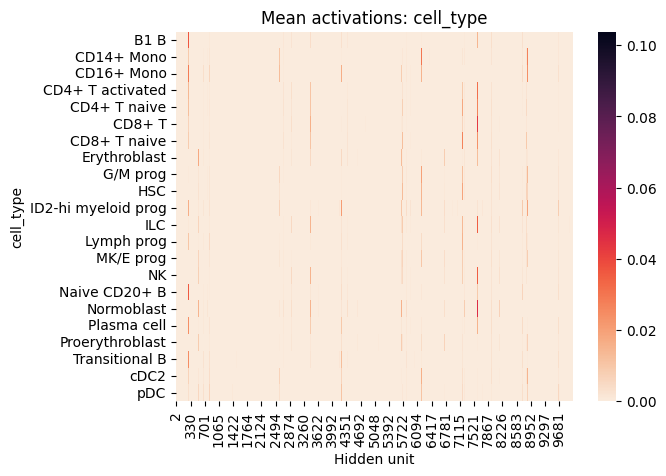

In [13]:
plot_obs_activations('cell_type', activations, unique_active_unit_indices)

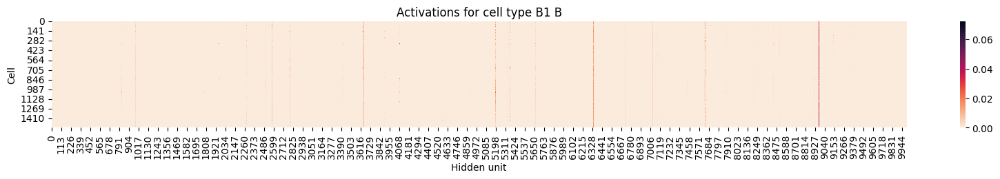

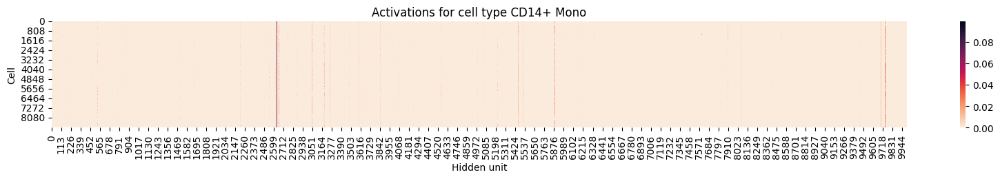

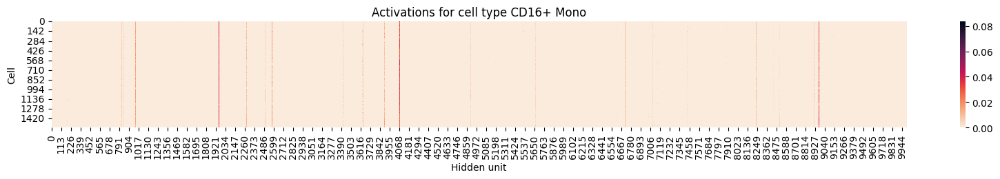

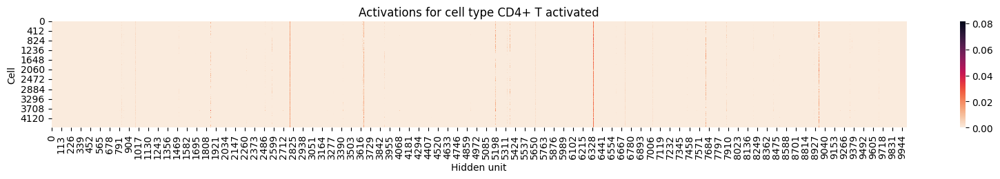

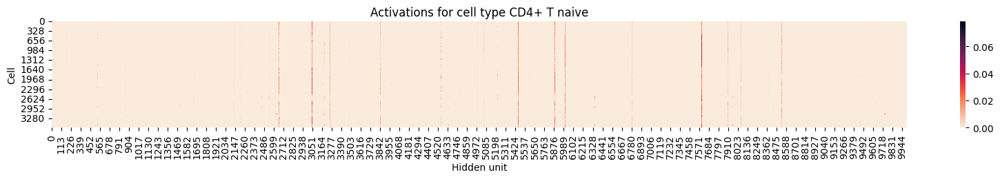

...

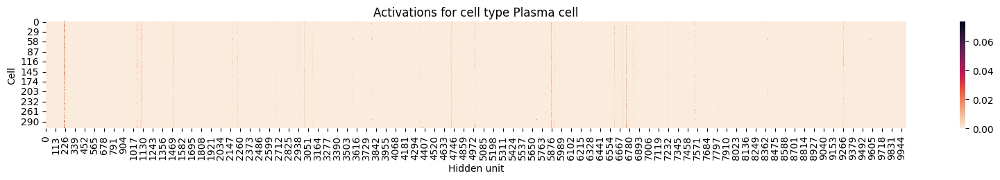

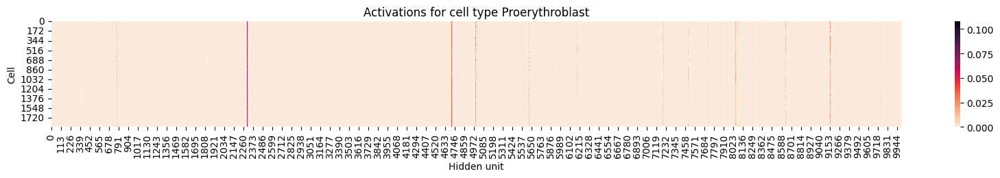

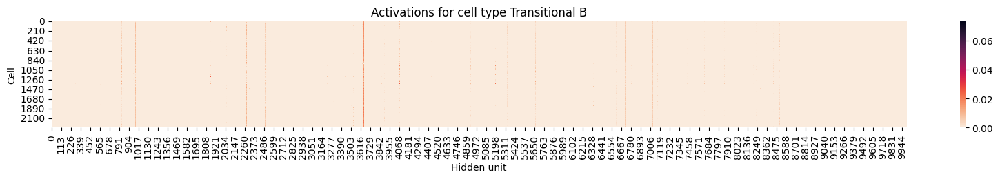

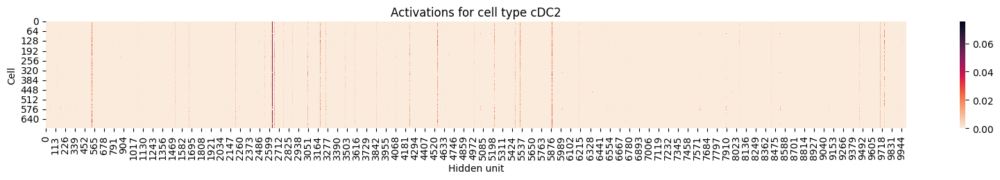

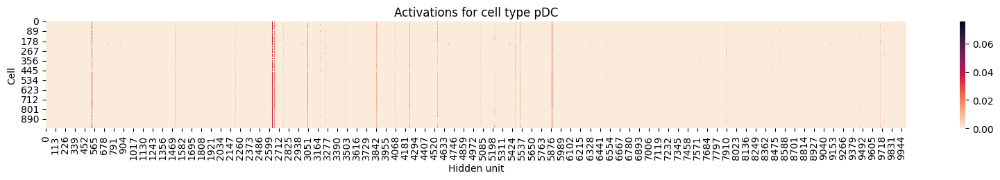

In [14]:
# loop through all cell types and make heatmap plots of their activations

# get the cell types
celltypes = np.unique(data.obs['cell_type'].values)

for ct in celltypes:
    ids_ct = data.obs['cell_type'] == ct
    activations_ct = activations[ids_ct].detach().cpu().numpy()
    fig, ax = plt.subplots(1, 1, figsize=(20, 2))
    sns.heatmap(activations_ct, cmap='rocket_r', ax=ax)
    plt.title(f'Activations for cell type {ct}')
    plt.xlabel('Hidden unit')
    plt.ylabel('Cell')
    plt.show()

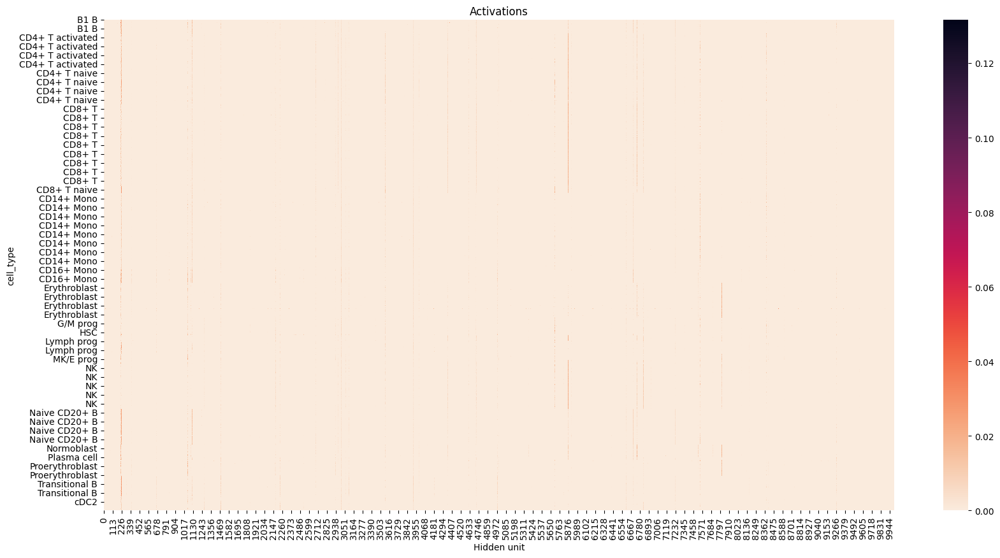

In [14]:
plot_activation_range(data, activations, obs='cell_type', plot_size=(20,10))

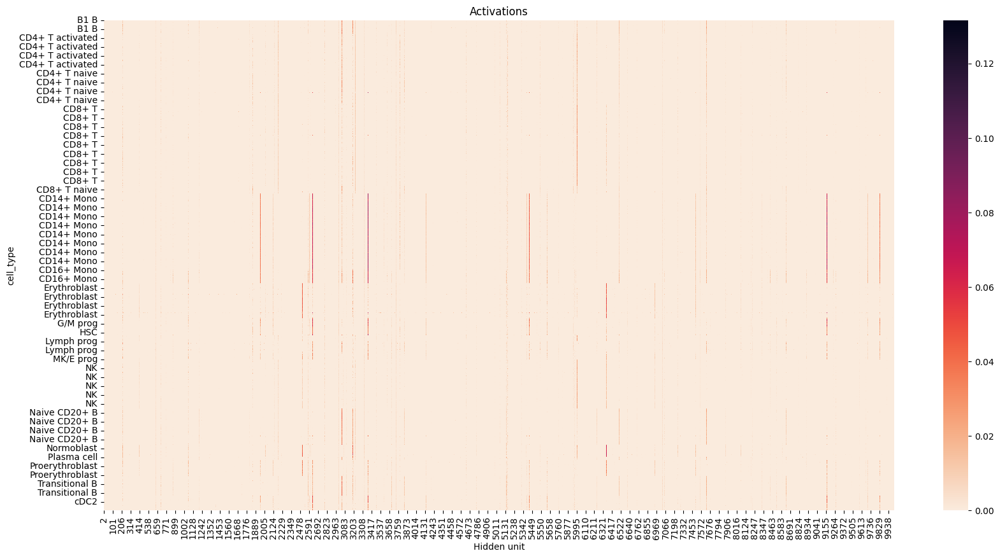

In [32]:
plot_activation_range(data, activations, indices=unique_active_unit_indices, obs='cell_type', plot_size=(20,10))

### Hematopoietic cell differentiation

Can I find features that increase from HSC to normoblast and is absent in other cell types?

In [51]:
hematopoiesis_features = unique_active_unit_indices.copy()

# conditions for features to be met

# 1. the average value of the feature must be higher in the hematopoietic cells than in the non-hematopoietic cells
celltypes = np.unique(data.obs['cell_type'].values)
hematopoietic_cells = ['MK/E prog', 'Proerythroblast', 'Erythroblast', 'Normoblast']
stem_cells = ['HSC']
non_hematopoietic_cells = [x for x in celltypes if x not in hematopoietic_cells + stem_cells]
temp_indices_true = np.where(data.obs['cell_type'].isin(hematopoietic_cells))[0]
temp_indices_false = np.where(data.obs['cell_type'].isin(non_hematopoietic_cells))[0]
avg_activations_true = np.mean(activations[temp_indices_true,:].detach().cpu().numpy(), axis=0)
avg_activations_false = np.mean(activations[temp_indices_false,:].detach().cpu().numpy(), axis=0)
condition_accepted = avg_activations_true > avg_activations_false
print(f'Condition 1: {np.sum(condition_accepted)} features meet the condition')
hematopoiesis_features = np.intersect1d(hematopoiesis_features, np.where(condition_accepted)[0])

# 2. the average value of the feature must be higher in the hematopoietic cells than in the stem cells
temp_indices_false = np.where(data.obs['cell_type'].isin(stem_cells))[0]
avg_activations_false = np.mean(activations[temp_indices_false,:].detach().cpu().numpy(), axis=0)
condition_accepted = avg_activations_true > avg_activations_false
print(f'Condition 2: {np.sum(condition_accepted)} features meet the condition')
hematopoiesis_features = np.intersect1d(hematopoiesis_features, np.where(condition_accepted)[0])
print(f'Number of hematopoiesis features: {len(hematopoiesis_features)}')
temp_indices_true, temp_indices_false, avg_activations_true, avg_activations_false = None, None, None, None

# 3. the average value must increase consistently from the stem cells to the hematopoietic cells
ct_1 = 'HSC'
for ct_2 in hematopoietic_cells:
    temp_indices_low = np.where(data.obs['cell_type'] == ct_1)[0]
    temp_indices_high = np.where(data.obs['cell_type'] == ct_2)[0]
    avg_activations_low = np.mean(activations[temp_indices_low,:].detach().cpu().numpy(), axis=0)
    avg_activations_high = np.mean(activations[temp_indices_high,:].detach().cpu().numpy(), axis=0)
    condition_accepted = avg_activations_low < avg_activations_high
    hematopoiesis_features = np.intersect1d(hematopoiesis_features, np.where(condition_accepted)[0])
    ct_1 = ct_2
print(f'Condition 3: Number of hematopoiesis features: {len(hematopoiesis_features)}')

Condition 1: 3043 features meet the condition
Condition 2: 3140 features meet the condition
Number of hematopoiesis features: 2661
Condition 3: Number of hematopoiesis features: 44


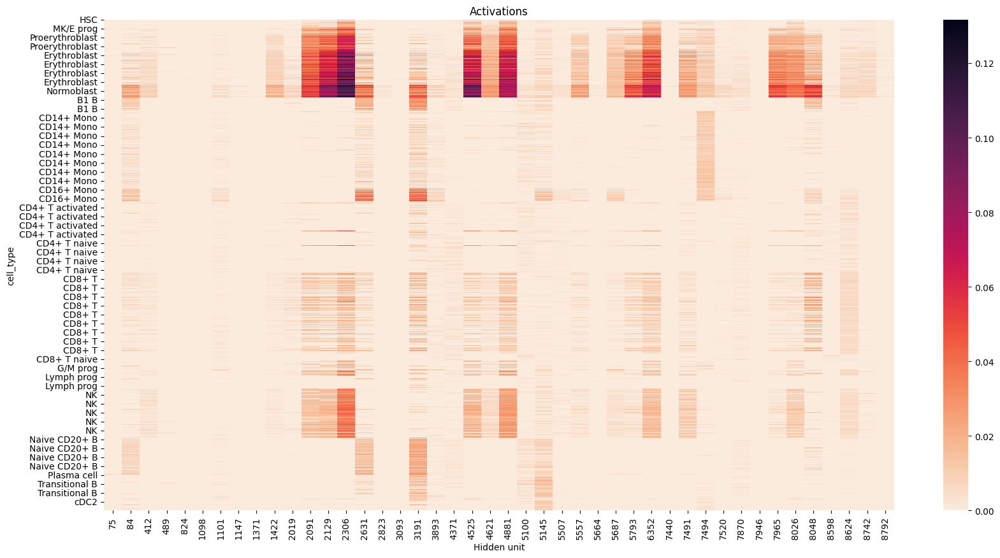

In [54]:
plot_activation_range(
    data,
    activations,
    indices=hematopoiesis_features,
    obs='cell_type',
    plot_size=(20,10),
    obs_order=stem_cells + hematopoietic_cells + non_hematopoietic_cells
)

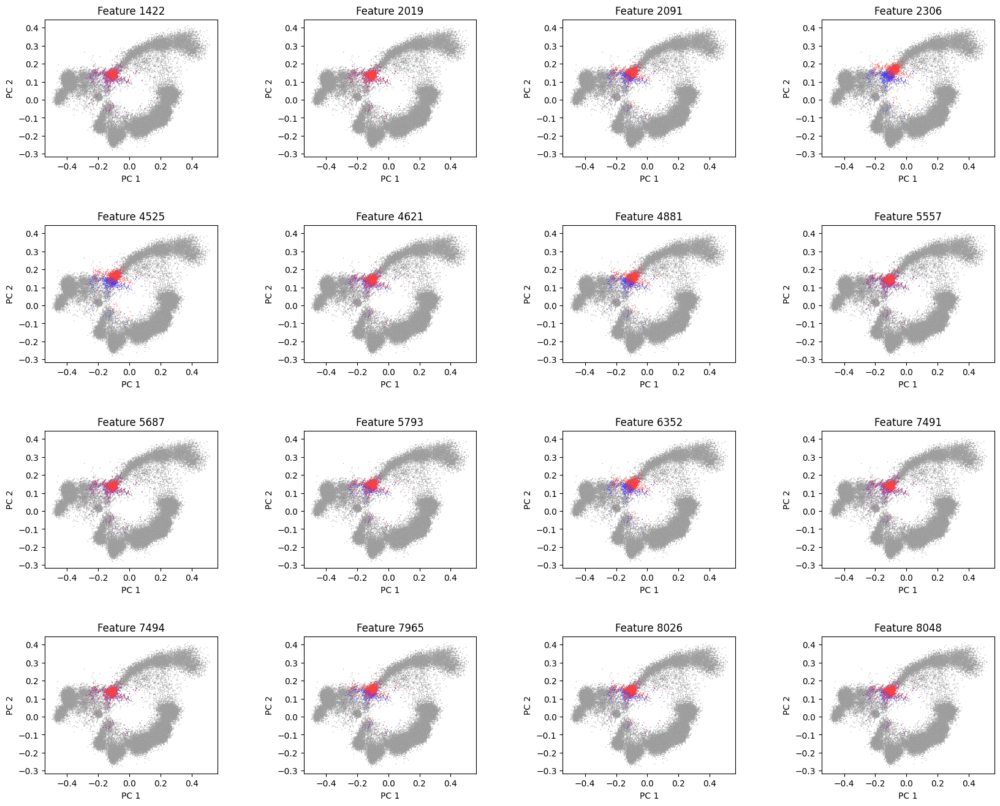

In [63]:
stricter_selection = [1422, 2019, 2091, 2306, 4525, 4621, 4881, 5557, 5687, 5793, 6352, 7491, 7494, 7965, 8026, 8048]

hsc_indices = np.where(data.obs['cell_type'] == 'HSC')[0]
latents_non_hsc = reps[np.where(data.obs['cell_type'] != 'HSC')[0], :].cpu().numpy()
latents_hsc = reps[hsc_indices, :].cpu().numpy()
activs_hsc = activations[hsc_indices, :]
active_values_normoblast = torch.Tensor(np.mean(activations[np.where(data.obs['cell_type'] == 'Normoblast')[0],:].detach().cpu().numpy(), axis=0)).to(device)

# for each feature, get the HSC samples and plot the predicted latents before and after perturbation

# make a figure with 4 columns and as many rows as needed for the features

if len(stricter_selection) % 4 == 0:
    n_rows = len(stricter_selection) // 4
else:
    n_rows = len(stricter_selection) // 4 + 1

fig, axs = plt.subplots(n_rows, 4, figsize=(20, 4*n_rows))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

i = 0
for feat in stricter_selection:
    activs_perturbed = activs_hsc.clone()
    activs_perturbed[:, feat] = active_values_normoblast[feat]
    latents_perturbed = sae_model.decoder(activs_perturbed.to(device)).detach().cpu().numpy()

    df_temp = pd.DataFrame(reps_transformed, columns=['PC 1', 'PC 2'])
    df_temp['type'] = 'other'
    df_temp2 = pd.DataFrame(pca.transform(latents_hsc), columns=['PC 1', 'PC 2'])
    df_temp2['type'] = 'HSC'
    df_temp = pd.concat([df_temp, df_temp2])
    df_temp2 = pd.DataFrame(pca.transform(latents_perturbed), columns=['PC 1', 'PC 2'])
    df_temp2['type'] = 'HSC perturbed'
    df_temp = pd.concat([df_temp, df_temp2])

    col, row = i % 4, i // 4
    sns.scatterplot(df_temp, x='PC 1', y='PC 2', hue='type', ax=axs[row, col], s=1, alpha=0.7, palette=['grey', 'blue', 'red'])
    axs[row, col].get_legend().remove()
    axs[row, col].set_title(f'Feature {feat}')
    i = i + 1

plt.show()

In [68]:
feat = 2306

###
# make perturbations
###

# get hsc latents
hsc_indices = np.where(data.obs['cell_type'] == 'HSC')[0]
latents_hsc = reps[hsc_indices, :]
cov_latents_hsc = model.correction_rep.z.detach()[hsc_indices, :]

# get activations
activs_hsc = activations[hsc_indices, :]
active_values_normoblast = torch.Tensor(np.mean(activations[np.where(data.obs['cell_type'] == 'Normoblast')[0],:].detach().cpu().numpy(), axis=0)).to(device)

# predict perturbations
activs_perturbed = activs_hsc.clone()
activs_perturbed[:, feat] = active_values_normoblast[feat]
latents_perturbed = sae_model.decoder(activs_perturbed.to(device))

# feed these latents into the dgd model and then do differential gene expression analysis on the predicted outputs
y_hsc = model.decoder(torch.cat((latents_hsc, cov_latents_hsc), dim=1))[0].detach().cpu().numpy()
y_perturb = model.decoder(torch.cat((latents_perturbed, cov_latents_hsc), dim=1))[0].detach().cpu().numpy()

# the predictions need to be scaled by the sum of the modality
library = data.obs['GEX_n_counts'].values[hsc_indices]
y_hsc = y_hsc * library.reshape(-1, 1)
y_perturb = y_perturb * library.reshape(-1, 1)

In [96]:
# do differential gene expression analysis: get p-values and fold changes for each gene

import statsmodels.api as sm
from statsmodels.genmod.families import NegativeBinomial
from statsmodels.stats.multitest import multipletests

# get the model's dispersions for the test
with torch.no_grad():
    dispersion_factors = (torch.exp(model.decoder.out_modules[0].distribution.log_r).detach().cpu().numpy() + 1).flatten()

# Assuming y_hsc and y_perturb are your gene expression matrices, shape (n_cells, n_genes)
# For example, if y_hsc has shape (1000, 5000), this means 1000 cells and 5000 genes

# Stack y_hsc and y_perturb side by side, resulting in (n_cells * 2, n_genes)
n_cells = y_hsc.shape[0]
n_genes = y_hsc.shape[1]

# Prepare condition and pairing information
# Condition: 0 for HSC, 1 for perturbation
conditions = np.array([0] * n_cells + [1] * n_cells)

# Pairing: Each pair corresponds to the same cell in HSC and perturbation
pairing = np.tile(np.arange(n_cells), 2)

# Initialize lists to store p-values and fold changes for each gene
p_values = []
fold_changes = []

# Loop over each gene (column)
for gene_idx in range(n_genes):
    # Combine the gene expression data for the current gene across both conditions
    gene_expression = np.concatenate([y_hsc[:, gene_idx], y_perturb[:, gene_idx]])

    # Design matrix: Intercept (ones), pairing, and condition
    X = np.column_stack([np.ones_like(conditions), pairing, conditions])

    # Fit a negative binomial model for the current gene
    glm_model = sm.GLM(gene_expression, X, family=NegativeBinomial(alpha=dispersion_factors[gene_idx]))
    result = glm_model.fit()

    # Extract p-value for the condition (perturbation effect)
    p_value = result.pvalues[2]  # The p-value for the "condition" variable
    fold_change = np.exp(result.params[2])  # Fold change is exp(beta)

    # Store results
    p_values.append(p_value)
    fold_changes.append(fold_change)

# Convert p-values and fold changes into a DataFrame
gene_p_values = pd.DataFrame({
    'gene': (data.var[data.var['modality'] == 'GEX']).index,  # Assuming you have gene names as your columns' index
    'p_value': p_values,
    'fold_change': fold_changes
})

# Adjust p-values for multiple testing using Benjamini-Hochberg correction
gene_p_values['adj_p_value'] = multipletests(gene_p_values['p_value'], method='fdr_bh')[1]

# Sort the results by p-value
gene_p_values = gene_p_values.sort_values(by='p_value')

# Print the top differentially expressed genes
print(gene_p_values.head())


          gene       p_value  fold_change   adj_p_value
13284     XACT  1.976589e-59     2.988791  2.654757e-55
2379   ZNF385D  5.406688e-47     2.107321  3.630862e-43
9263      RYR3  3.793419e-29     2.756555  1.698313e-25
9863     ACSM3  1.796112e-21     2.220642  6.030896e-18
489       NFIA  1.345100e-19     1.810310  3.613208e-16


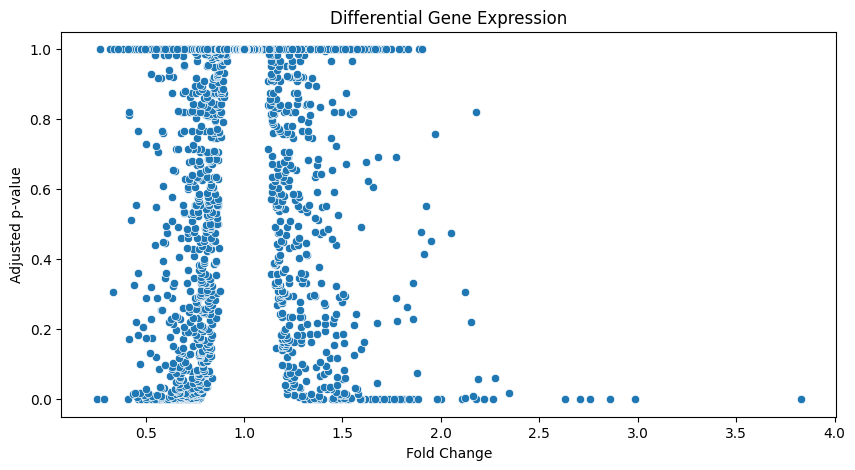

In [99]:
# plot fold change against adjusted p value
plt.figure(figsize=(10, 5))
sns.scatterplot(data=gene_p_values, x='fold_change', y='adj_p_value')
plt.xlabel('Fold Change')
plt.ylabel('Adjusted p-value')
plt.title('Differential Gene Expression')
plt.show()

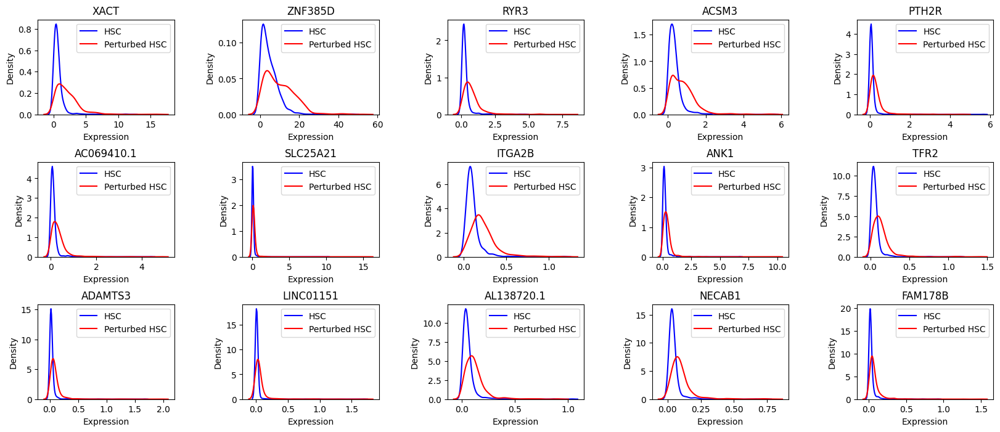

In [100]:
# look at the genes above a certain threshold
fold_change_threshold = 2.0
p_value_threshold = 0.05
top_genes = gene_p_values[(gene_p_values['fold_change'] > fold_change_threshold) & (gene_p_values['adj_p_value'] < p_value_threshold)]['gene']

# make a figure with 5 columns and as many rows as needed for the features
if len(top_genes) % 5 == 0:
    n_rows = len(top_genes) // 5
else:
    n_rows = len(top_genes) // 5 + 1

fig, axs = plt.subplots(n_rows, 5, figsize=(20, 8))
fig.subplots_adjust(hspace=0.5, wspace=0.5)

for i, gene in enumerate(top_genes):
    col, row = i % 5, i // 5
    gene_index = np.where(data.var.index == gene)[0][0]
    sns.kdeplot(y_hsc[:, gene_index], ax=axs[row, col], color='blue', label='HSC')
    sns.kdeplot(y_perturb[:, gene_index], ax=axs[row, col], color='red', label='Perturbed HSC')
    axs[row, col].set_title(gene)
    axs[row, col].set_xlabel('Expression')
    axs[row, col].set_ylabel('Density')
    axs[row, col].legend()

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


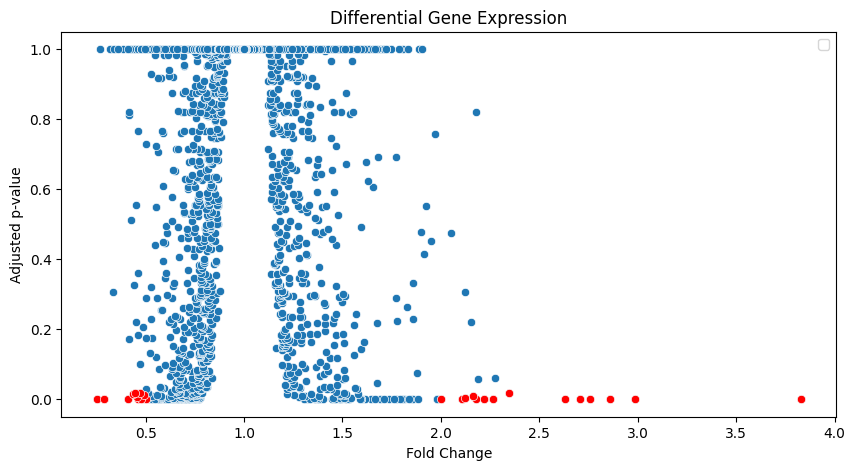

In [109]:
# look at the genes above a certain threshold
fold_change_threshold = [0.5, 2.0]
p_value_threshold = 0.05
top_genes = gene_p_values[((gene_p_values['fold_change'] < fold_change_threshold[0]) | (gene_p_values['fold_change'] > fold_change_threshold[1])) & (gene_p_values['adj_p_value'] < p_value_threshold)]['gene']

# highlight the top genes in the scatter plot

# plot fold change against adjusted p value
plt.figure(figsize=(10, 5))
sns.scatterplot(data=gene_p_values, x='fold_change', y='adj_p_value')
plt.xlabel('Fold Change')
plt.ylabel('Adjusted p-value')
plt.title('Differential Gene Expression')
top_genes_indices = np.where(gene_p_values['gene'].isin(top_genes))[0]
sns.scatterplot(data=gene_p_values.iloc[top_genes_indices], x='fold_change', y='adj_p_value', color='red')
plt.legend()
plt.show()

In [111]:
# export as txt file

top_genes.to_csv(f'03_results/models/feature{feat}_significant_genes.txt', sep='\t', index=False, header=False)

In [114]:
# list all genes with p values below an adjusted value
p_value_threshold = 0.001

top_genes = gene_p_values[gene_p_values['adj_p_value'] < p_value_threshold]['gene']
print(top_genes)

top_genes.to_csv(f'03_results/models/feature{feat}_significant_genes_pval001.txt', sep='\t', index=False, header=False)

13284       XACT
2379     ZNF385D
9263        RYR3
9863       ACSM3
489         NFIA
          ...   
3336      CCSER1
12247      PLCB1
9126       TTC7B
9231       IGHG1
3257     ADAMTS3
Name: gene, Length: 86, dtype: object


In [115]:
# list all genes with p values below an adjusted value
p_value_threshold = 0.0001

top_genes = gene_p_values[gene_p_values['adj_p_value'] < p_value_threshold]['gene']
print(top_genes)

top_genes.to_csv(f'03_results/models/feature{feat}_significant_genes_pval0001.txt', sep='\t', index=False, header=False)

13284          XACT
2379        ZNF385D
9263           RYR3
9863          ACSM3
489            NFIA
3229       KIAA1211
509           PDE4B
4868     AL589693.1
2142          PTH2R
2867     AC069410.1
12278       SLC24A3
527           NEGR1
4087           EBF1
2385           THRB
12555           APP
9230          IGHA1
4568          RUNX2
9645          MCTP2
5935         CCDC26
1241       CDC42BPA
3356        SLC39A8
1729           IGKC
12727         IGLC2
11195          TCF4
505          DNAJC6
6838      LINC01374
6977          PDZD8
1150           RHEX
3284         ANTXR2
565         COL24A1
5238        PPP1R9A
9106          STON2
11218          BCL2
6152        PIP5K1B
8870       SLC25A21
2380         UBE2E2
2065     AC098617.1
2044        SLC40A1
10700        ITGA2B
5696           ANK1
8673          DACH1
5892         SAMD12
5792           PAG1
1627       ARHGAP25
8703          ABCC4
1485          LTBP1
3392         ELOVL6
4109        RANBP17
2363          RFTN1
8556           FLT3


In [117]:
# list all genes with p values below an adjusted value
p_value_threshold = 1e-5

top_genes = gene_p_values[gene_p_values['adj_p_value'] < p_value_threshold]['gene']
print(top_genes)

top_genes.to_csv(f'03_results/models/feature{feat}_significant_genes_pval1e-5.txt', sep='\t', index=False, header=False)

13284          XACT
2379        ZNF385D
9263           RYR3
9863          ACSM3
489            NFIA
3229       KIAA1211
509           PDE4B
4868     AL589693.1
2142          PTH2R
2867     AC069410.1
12278       SLC24A3
527           NEGR1
4087           EBF1
2385           THRB
12555           APP
9230          IGHA1
4568          RUNX2
9645          MCTP2
5935         CCDC26
1241       CDC42BPA
3356        SLC39A8
1729           IGKC
12727         IGLC2
11195          TCF4
505          DNAJC6
6838      LINC01374
6977          PDZD8
1150           RHEX
3284         ANTXR2
565         COL24A1
5238        PPP1R9A
9106          STON2
11218          BCL2
6152        PIP5K1B
8870       SLC25A21
2380         UBE2E2
2065     AC098617.1
2044        SLC40A1
10700        ITGA2B
5696           ANK1
8673          DACH1
Name: gene, dtype: object


In [105]:
gene_p_values

,gene,p_value,fold_change,adj_p_value
13284,XACT,1.976589e-59,2.988791,2.654757e-55
2379,ZNF385D,5.406688e-47,2.107321,3.630862e-43
9263,RYR3,3.793419e-29,2.756555,1.698313e-25
9863,ACSM3,1.796112e-21,2.220642,6.030896e-18
489,NFIA,1.345100e-19,1.810310,3.613208e-16
...,...,...,...,...
10239,CTU2,9.995671e-01,0.999816,9.997952e-01
8678,KLF5,9.995718e-01,0.999880,9.997952e-01
5083,STK17A,9.997680e-01,0.999970,9.999169e-01
11428,MARCH2,9.999240e-01,0.999972,9.999247e-01


### look at highly variable activations

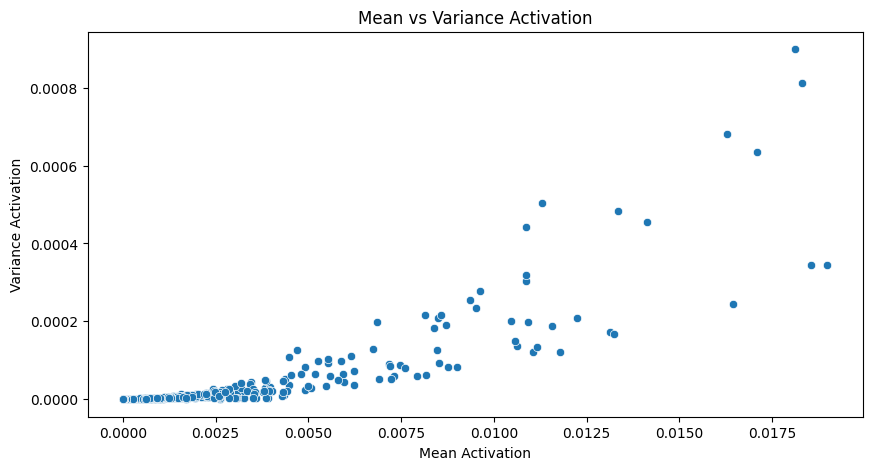

Units with variance above 0.0001: [2129 2306 2634 3379 4525 4881 6535 9161]


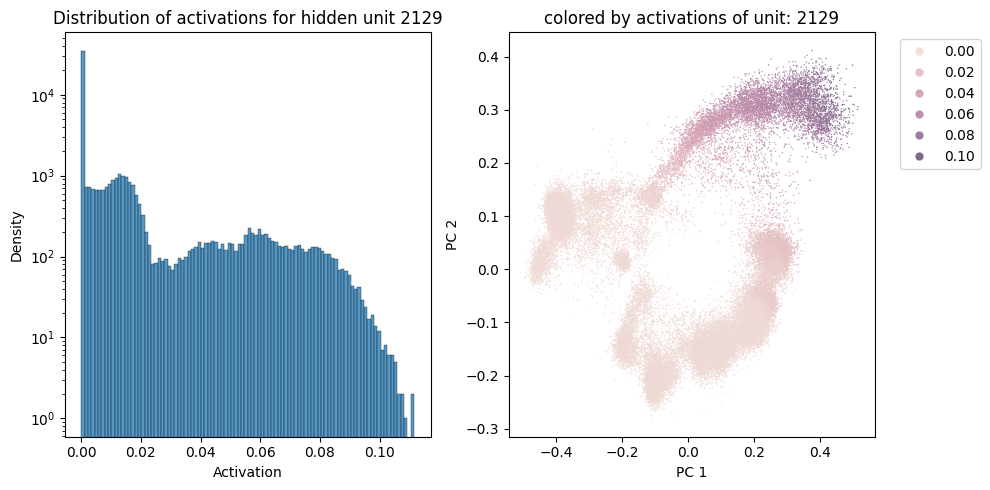

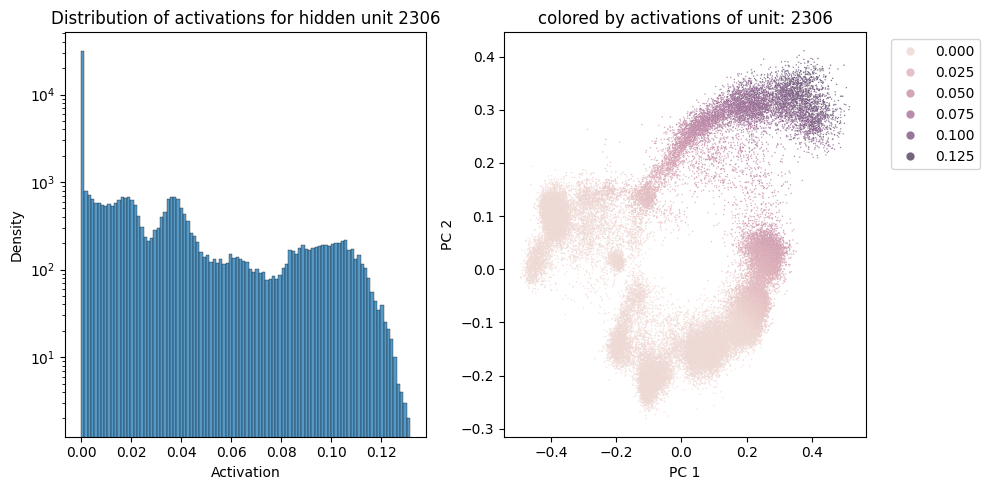

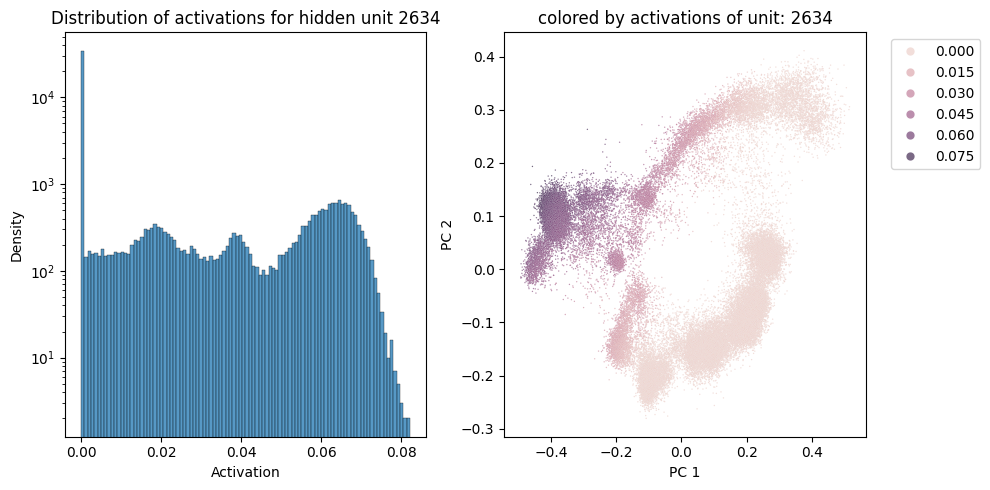

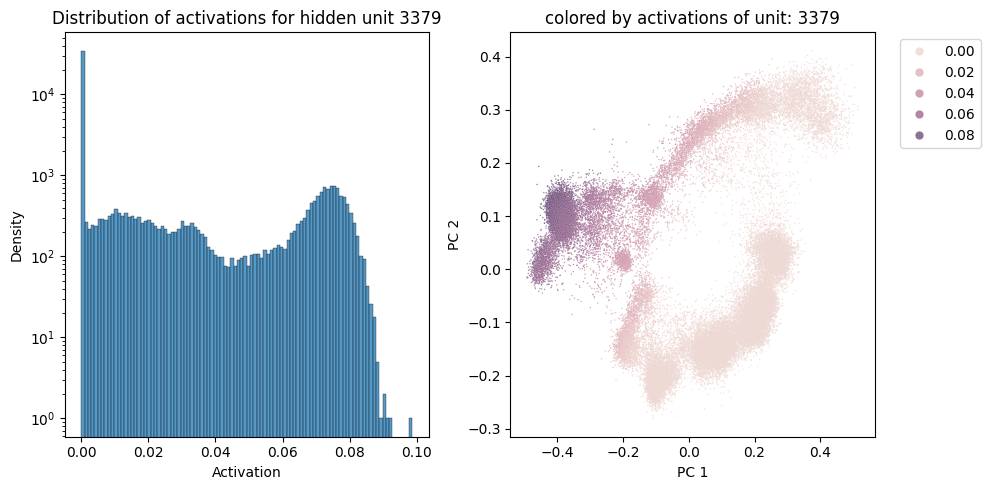

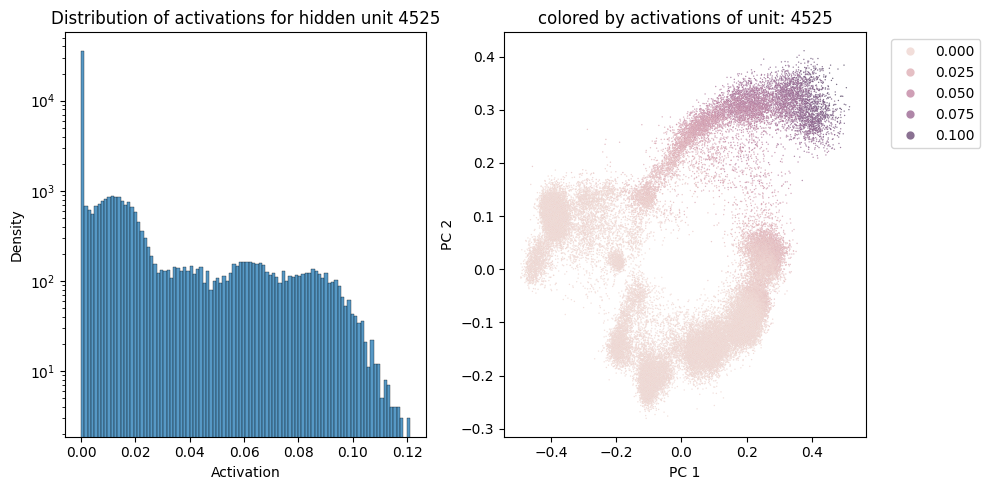

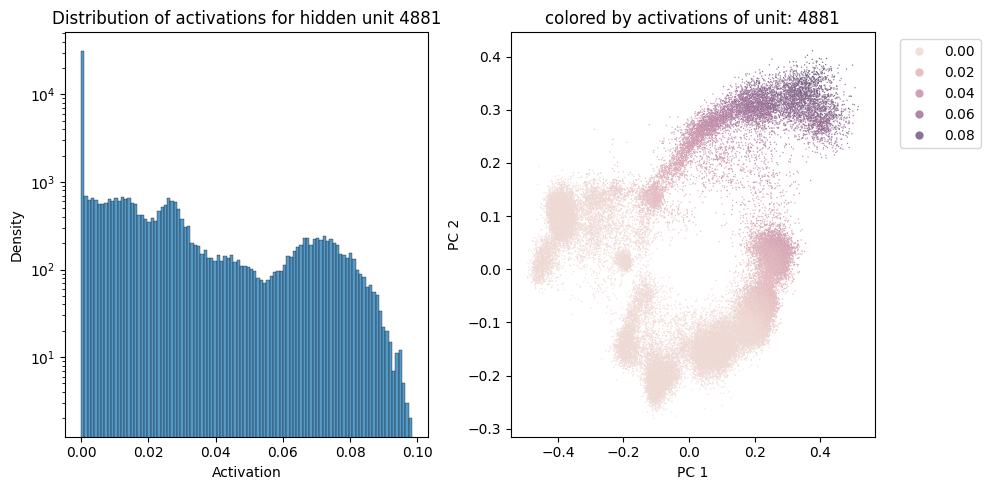

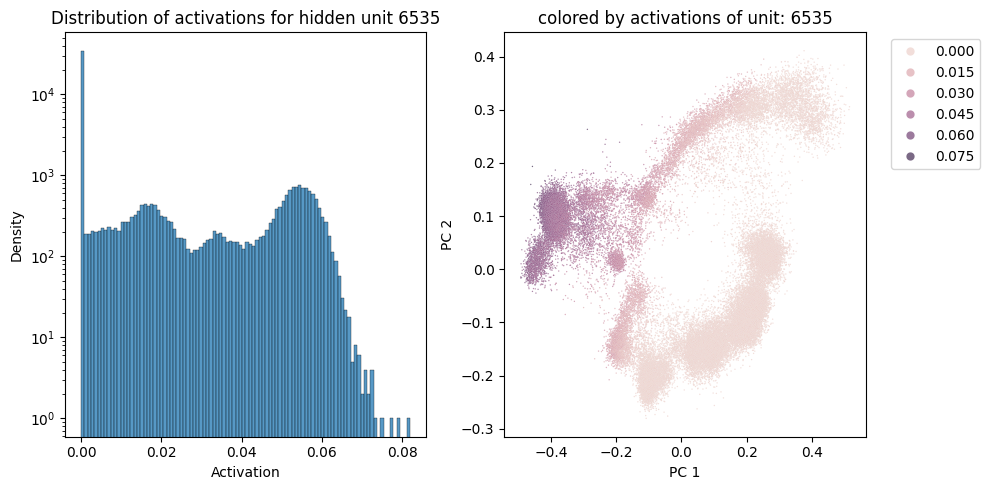

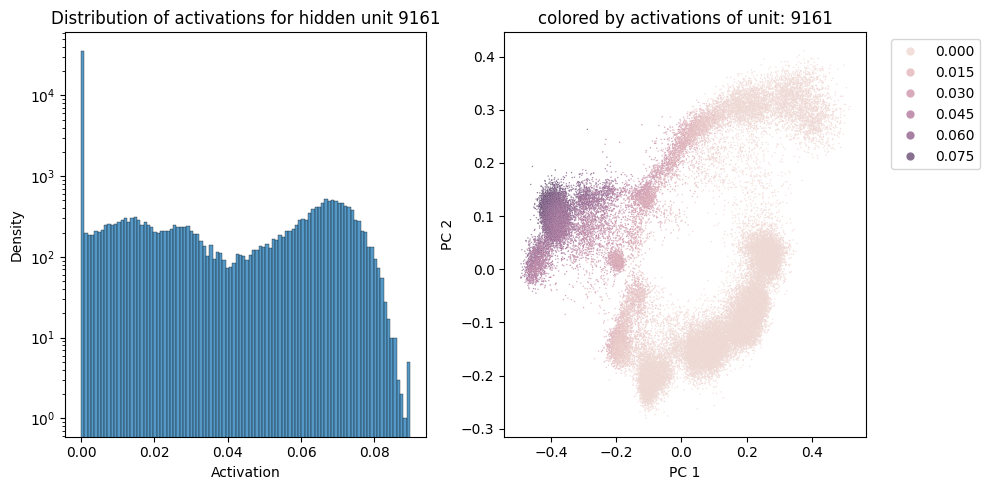

In [16]:
# check activations by their mean and variance

activ_means = activations.mean(dim=0).detach().cpu().numpy()
activ_vars = activations.var(dim=0).detach().cpu().numpy()

plt.figure(figsize=(10, 5))
sns.scatterplot(x=activ_means, y=activ_vars)
plt.xlabel('Mean Activation')
plt.ylabel('Variance Activation')
plt.title('Mean vs Variance Activation')
plt.show()

var_units = np.where(activ_vars > 0.0004)[0]
print(f'Units with variance above 0.0001: {var_units}')

units_of_interest = var_units

# for each of the active units, check which samples have them active
# also look at the distribution

for i, individual_activation in enumerate(units_of_interest):

    # make a figure with 3 columns and 1 row (I will use the first two columns for the histogram and the last one for the PCA)
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    #sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0:2])
    sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0])
    axs[0].set_yscale('log')
    axs[0].set_title(f'Distribution of activations for hidden unit {individual_activation}')
    axs[0].set_xlabel('Activation')
    axs[0].set_ylabel('Density')

    df_celltypes = pd.DataFrame(reps_transformed, columns=['PC 1', 'PC 2'])
    df_celltypes['activation'] = activations[:, individual_activation].detach().cpu().numpy()

    df_celltypes = df_celltypes.sort_values(by='activation', ascending=False)

    # plot the pca
    sns.scatterplot(data=df_celltypes, x='PC 1', y='PC 2', hue='activation', ax=axs[1], s=1, alpha=0.7)
    axs[1].set_title(f'colored by activations of unit: {individual_activation}')
    axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)

    plt.tight_layout()
    plt.show()

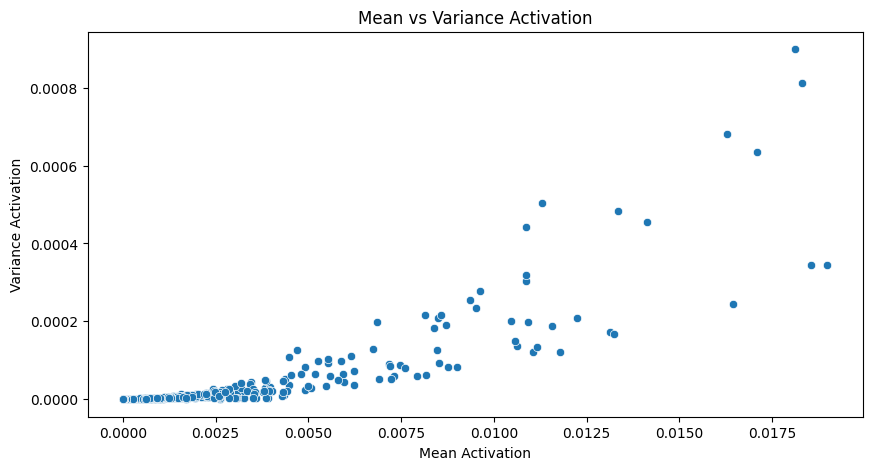

Units with mean above threshold: [1249 2306 2634 3379 7602 8097 9161]


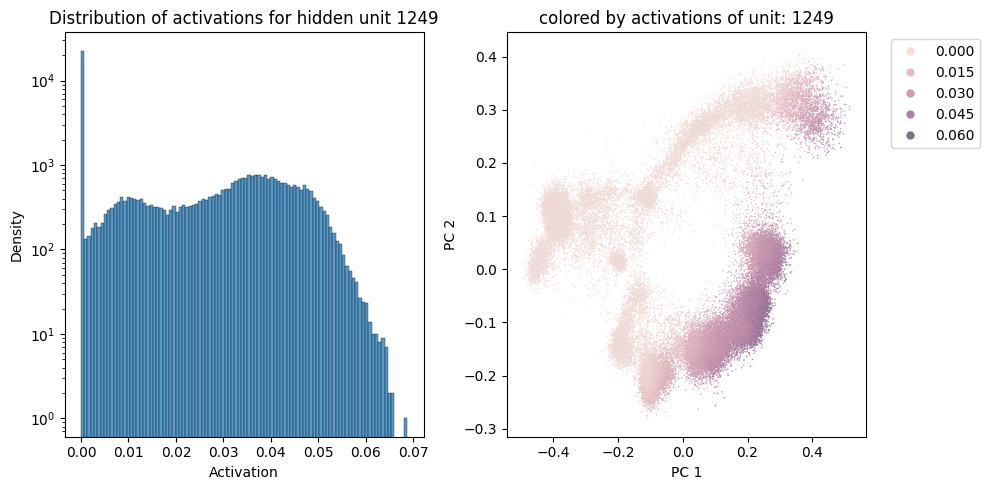

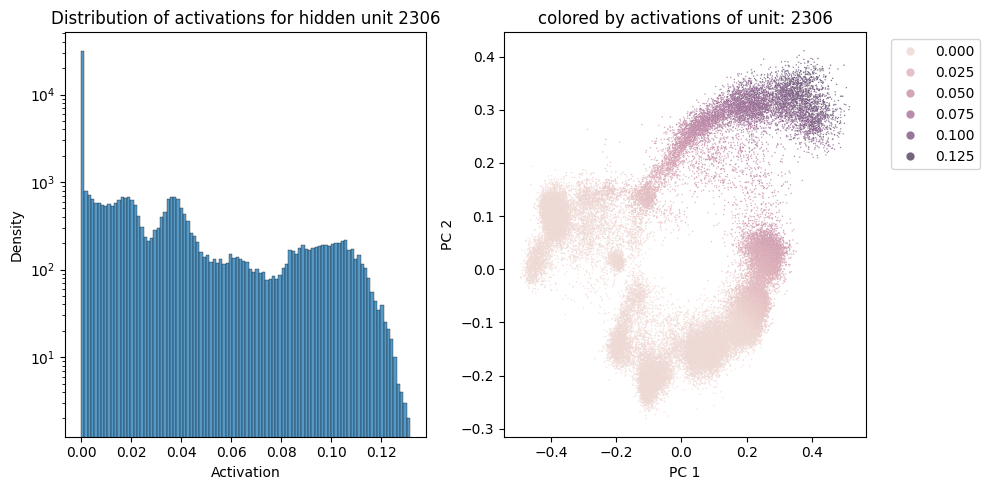

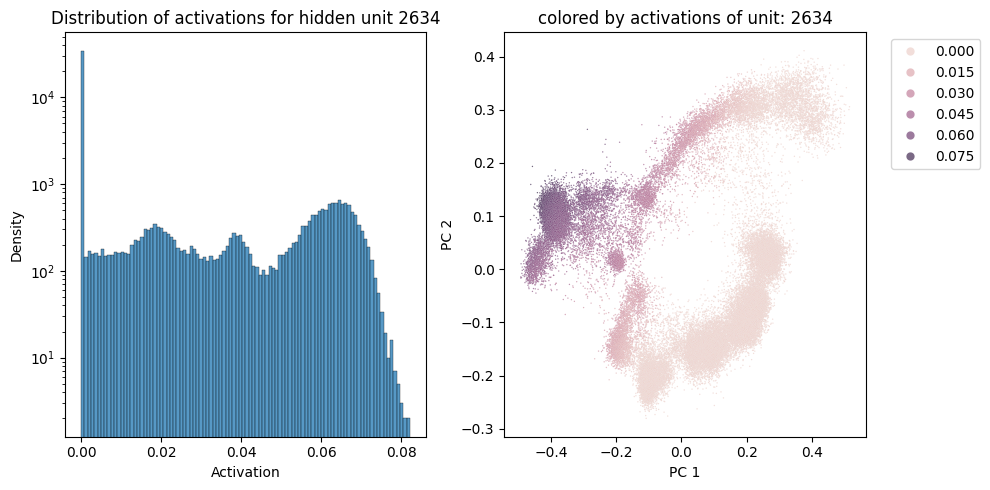

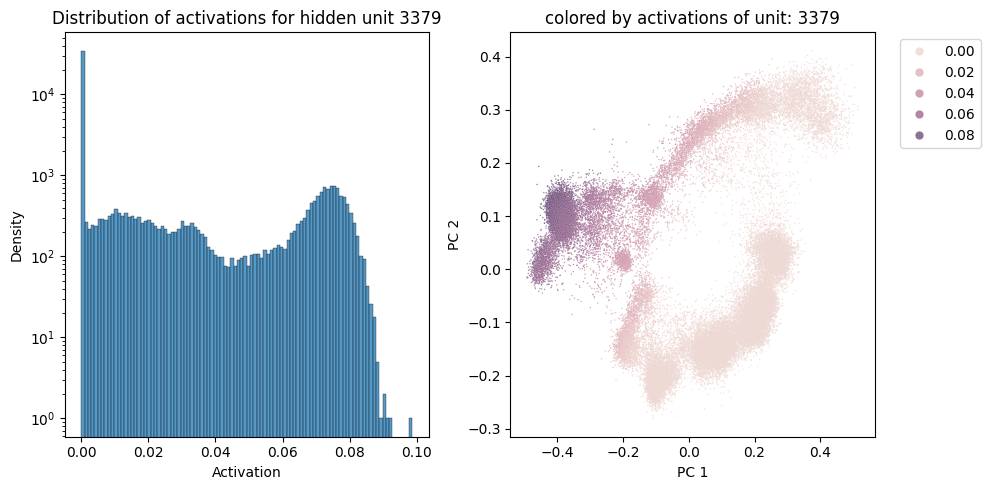

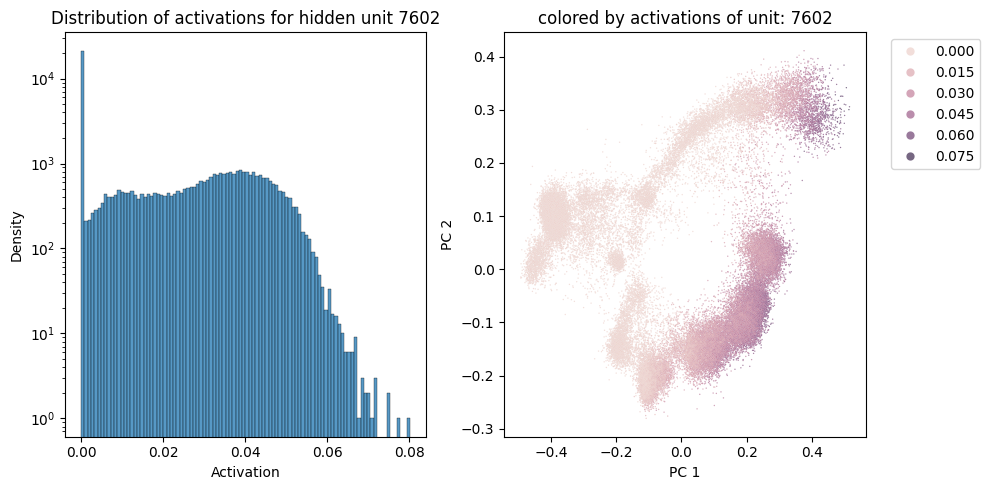

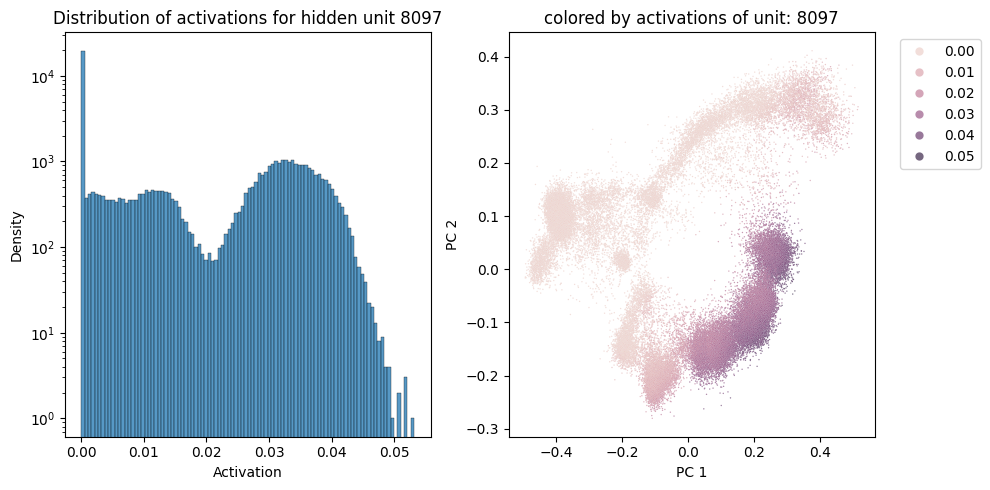

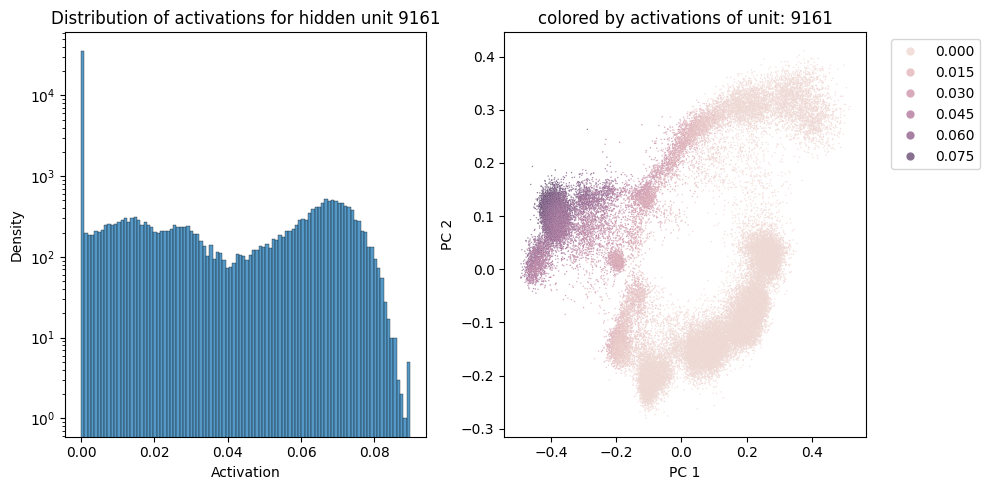

In [20]:
# check activations by their mean and variance

activ_means = activations.mean(dim=0).detach().cpu().numpy()
activ_vars = activations.var(dim=0).detach().cpu().numpy()

plt.figure(figsize=(10, 5))
sns.scatterplot(x=activ_means, y=activ_vars)
plt.xlabel('Mean Activation')
plt.ylabel('Variance Activation')
plt.title('Mean vs Variance Activation')
plt.show()

var_units = np.where(activ_means > 0.015)[0]
print(f'Units with mean above threshold: {var_units}')

units_of_interest = var_units

# for each of the active units, check which samples have them active
# also look at the distribution

for i, individual_activation in enumerate(units_of_interest):

    # make a figure with 3 columns and 1 row (I will use the first two columns for the histogram and the last one for the PCA)
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    #sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0:2])
    sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0])
    axs[0].set_yscale('log')
    axs[0].set_title(f'Distribution of activations for hidden unit {individual_activation}')
    axs[0].set_xlabel('Activation')
    axs[0].set_ylabel('Density')

    df_celltypes = pd.DataFrame(reps_transformed, columns=['PC 1', 'PC 2'])
    df_celltypes['activation'] = activations[:, individual_activation].detach().cpu().numpy()

    df_celltypes = df_celltypes.sort_values(by='activation', ascending=False)

    # plot the pca
    sns.scatterplot(data=df_celltypes, x='PC 1', y='PC 2', hue='activation', ax=axs[1], s=1, alpha=0.7)
    axs[1].set_title(f'colored by activations of unit: {individual_activation}')
    axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)

    plt.tight_layout()
    plt.show()

### investivate single features: 222

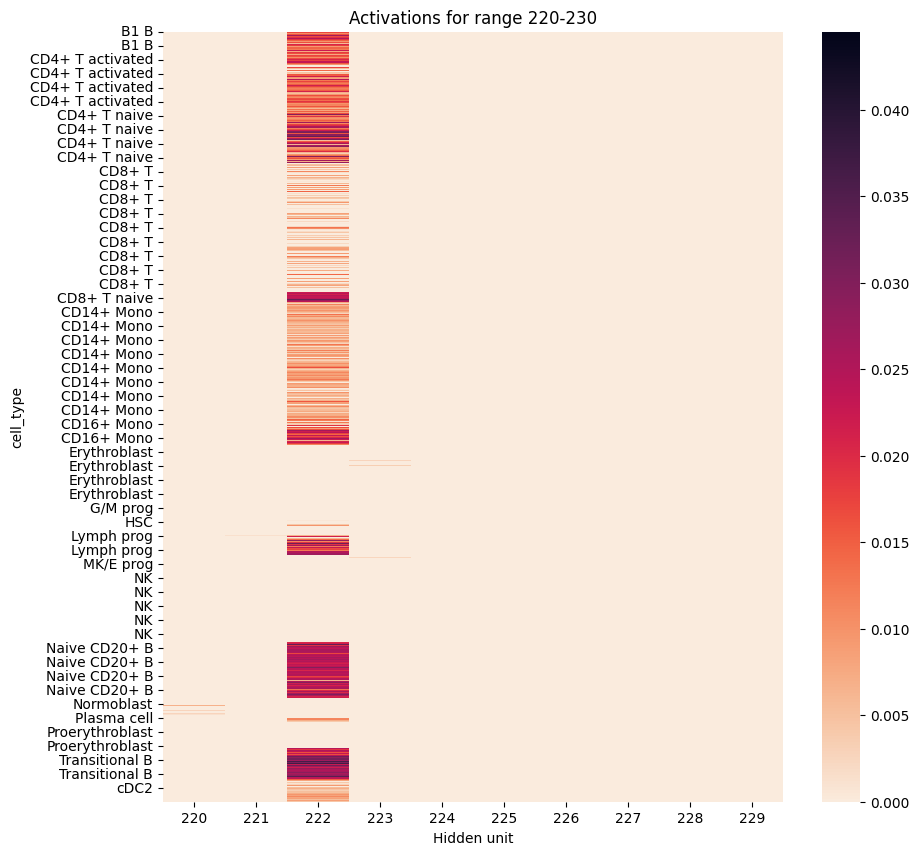

In [13]:
feature_range = [220, 230]

plot_activation_range(data, activations, feature_range, obs='cell_type')

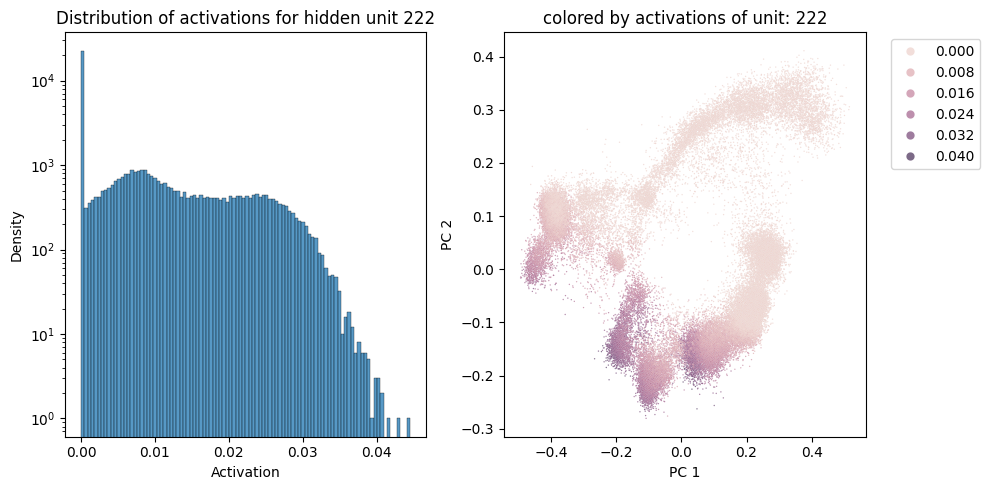

In [16]:
# plot distribution of activations for a specific feature

units_of_interest = [222]

for i, individual_activation in enumerate(units_of_interest):

    # make a figure with 3 columns and 1 row (I will use the first two columns for the histogram and the last one for the PCA)
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    #sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0:2])
    sns.histplot(activations[:, individual_activation].detach().cpu().numpy(), bins=100, ax=axs[0])
    axs[0].set_yscale('log')
    axs[0].set_title(f'Distribution of activations for hidden unit {individual_activation}')
    axs[0].set_xlabel('Activation')
    axs[0].set_ylabel('Density')

    df_celltypes = pd.DataFrame(reps_transformed, columns=['PC 1', 'PC 2'])
    df_celltypes['activation'] = activations[:, individual_activation].detach().cpu().numpy()

    df_celltypes = df_celltypes.sort_values(by='activation', ascending=False)

    # plot the pca
    sns.scatterplot(data=df_celltypes, x='PC 1', y='PC 2', hue='activation', ax=axs[1], s=1, alpha=0.7)
    axs[1].set_title(f'colored by activations of unit: {individual_activation}')
    axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)

    plt.tight_layout()
    plt.show()

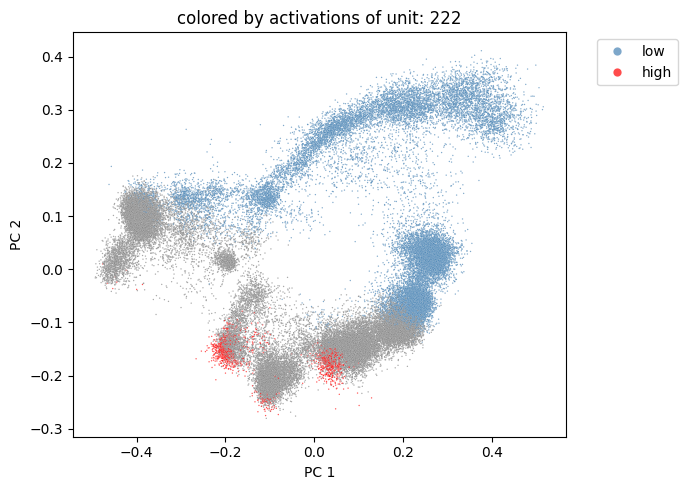

In [17]:
# split up the data into low and high activation for a given feature

feature_id = 222

low_ids = activations[:, feature_id] < 0.001
high_ids = activations[:, feature_id] > 0.03

# color the pca by the low and high activation (the rest gray)
df_celltypes = pd.DataFrame(reps_transformed, columns=['PC 1', 'PC 2'])
df_celltypes['activation'] = ''
df_celltypes['activation'].values[low_ids.detach().cpu()] = 'low'
df_celltypes['activation'].values[high_ids.detach().cpu()] = 'high'
# make it categorical and sort from nothing to low to high
df_celltypes['activation'] = df_celltypes['activation'].astype('category')
df_celltypes['activation'] = df_celltypes['activation'].cat.reorder_categories(['', 'low', 'high'])
# plot the pca
fig, ax = plt.subplots(1, 1, figsize=(7, 5))
sns.scatterplot(data=df_celltypes, x='PC 1', y='PC 2', hue='activation', ax=ax, s=1, alpha=0.7, palette=['gray', 'steelblue', 'red'])
plt.title(f'colored by activations of unit: {feature_id}')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', markerscale=6)
plt.tight_layout()
plt.show()

In [19]:
# pick out the samples with high activation and look at what is different about them (meta data and gene expression)

meta_high = data[np.where(high_ids.detach().cpu().numpy())[0]].obs
meta_low = data[np.where(low_ids.detach().cpu().numpy())[0]].obs

from scipy import stats

# perform non-parametric tests on the meta data
for obs in meta_high.columns:
    # check if continuous or categorical by datatype
    if meta_high[obs].dtype != 'category':
        try:
            print(f'{obs}')
            print(stats.mannwhitneyu(meta_high[obs], meta_low[obs]))
            print(' ')
        except:
            print(f'Could not perform test on {obs}')
            print(' ')
    else:
        print(f'{obs}')
        contingency_table = pd.crosstab(data.obs[obs], high_ids.detach().cpu())
        chi2, p, _, _ = stats.chi2_contingency(contingency_table)
        print(f'chi2 and p-value: {chi2}, {p}')
        #print(stats.chisquare(meta_high[obs].value_counts(), meta_low[obs].value_counts()))
        print(' ')

GEX_pct_counts_mt
MannwhitneyuResult(statistic=16950486.0, pvalue=2.4879454438251565e-24)
 
GEX_n_counts
MannwhitneyuResult(statistic=8566036.0, pvalue=4.760735852961733e-132)
 
GEX_n_genes
MannwhitneyuResult(statistic=8930438.5, pvalue=1.5528087252290517e-116)
 
GEX_size_factors
MannwhitneyuResult(statistic=11203803.0, pvalue=6.780892946251295e-42)
 
GEX_phase
chi2 and p-value: 43.5895954256723, 3.4248347319486604e-10
 
ATAC_nCount_peaks
MannwhitneyuResult(statistic=13439712.5, pvalue=1.4926307238701788e-05)
 
ATAC_atac_fragments
MannwhitneyuResult(statistic=11861492.5, pvalue=2.0846832556587683e-27)
 
ATAC_reads_in_peaks_frac
MannwhitneyuResult(statistic=19129381.5, pvalue=7.716841965535534e-82)
 
ATAC_blacklist_fraction
MannwhitneyuResult(statistic=14148515.0, pvalue=0.160183700517042)
 
ATAC_nucleosome_signal
MannwhitneyuResult(statistic=8114754.5, pvalue=1.2740913472464199e-152)
 
cell_type
chi2 and p-value: 7046.079367187709, 0.0
 
batch
chi2 and p-value: 1500.3140524620187, 0.0


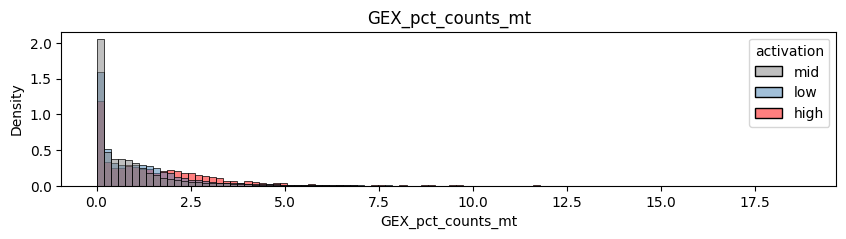

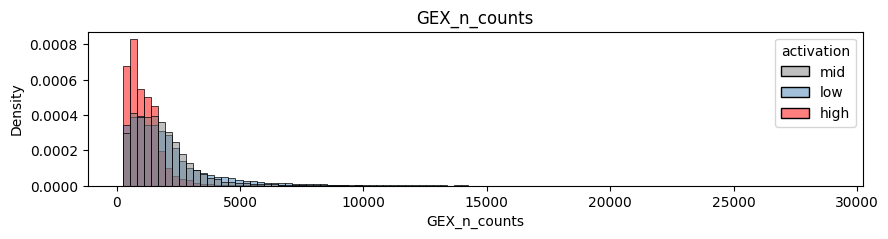

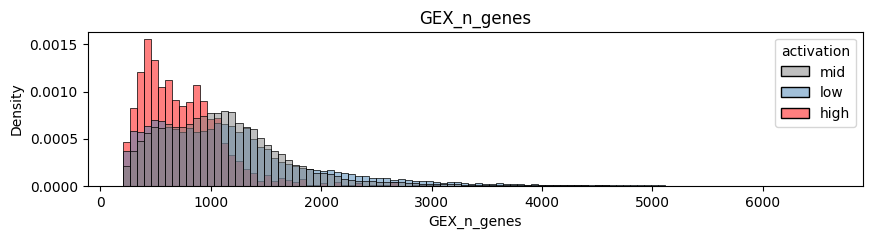

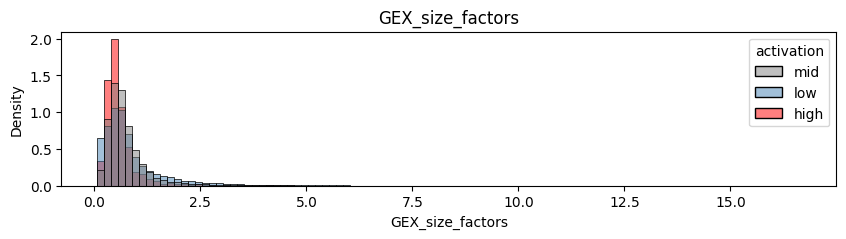

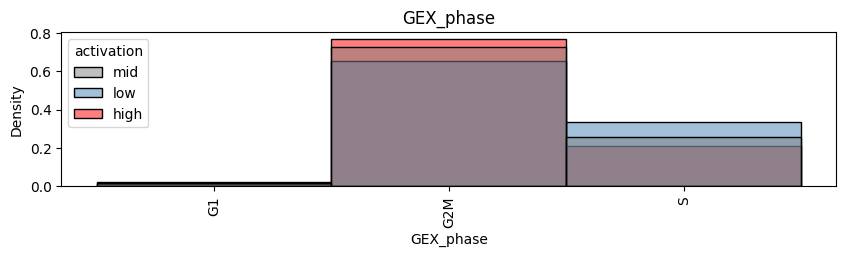

...

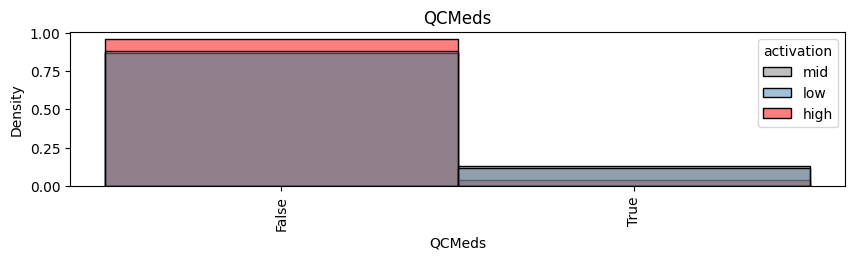

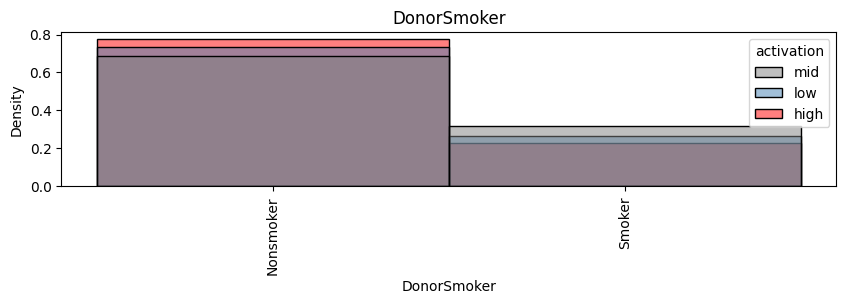

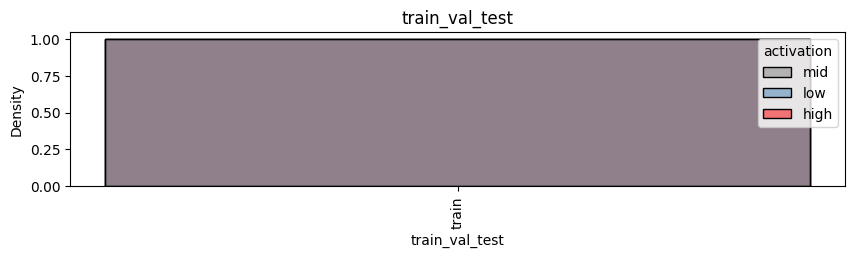

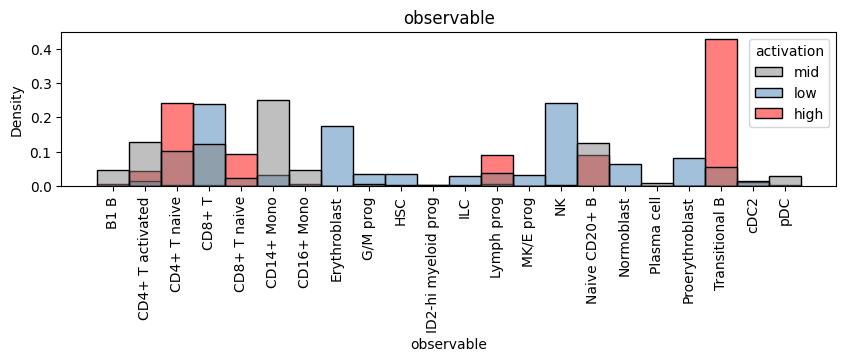

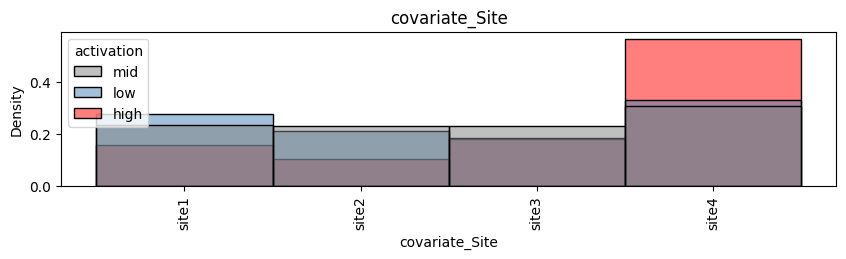

In [20]:
# plot the distriutions of values for the high and low activation samples

meta_mid = data[np.where(~low_ids.detach().cpu().numpy() & ~high_ids.detach().cpu().numpy())[0]].obs

for obs in meta_high.columns:
    df_temp = pd.DataFrame({obs: data.obs[obs].values,})
    df_temp['activation'] = 'mid'
    df_temp['activation'].values[low_ids.detach().cpu()] = 'low'
    df_temp['activation'].values[high_ids.detach().cpu()] = 'high'
    df_temp['activation'] = df_temp['activation'].astype('category')
    df_temp['activation'] = df_temp['activation'].cat.reorder_categories(['mid', 'low', 'high'])

    fig, ax = plt.subplots(1, 1, figsize=(10, 2))
    # histogram with adjusted density
    sns.histplot(data=df_temp, x=obs, hue='activation', ax=ax, bins=100, common_norm=False, stat='density', palette=['gray', 'steelblue', 'red'])
    # if categorical, I want the x-axis labels to be turned 90 degrees
    if data.obs[obs].dtype == 'category':
        plt.xticks(rotation=90)
    plt.title(f'{obs}')
    plt.show()

In [36]:
# Convert tensors to numpy once, outside of the loop
high_ids_np = high_ids.detach().cpu().numpy()
low_ids_np = low_ids.detach().cpu().numpy()

data_X_high = np.asarray(data.X[high_ids_np, :].todense())
data_X_low = np.asarray(data.X[low_ids_np, :].todense())

p_values = np.empty(data.shape[1])

from tqdm import tqdm
for i in tqdm(range(data.shape[1])):
    p_values[i] = stats.mannwhitneyu(data_X_high[:, i], data_X_low[:, i]).pvalue

# Create DataFrame for gene names and p-values
gene_p_values = pd.DataFrame({
    'gene': data.var.index,
    'p_value': p_values
})

100%|██████████| 129921/129921 [18:22<00:00, 117.79it/s]


In [53]:
gene_p_values

,gene,p_value,modality,mean
0,AL627309.5,1.469269e-01,GEX,0.014868
1,LINC01409,1.652220e-01,GEX,0.048526
2,LINC01128,2.076688e-06,GEX,0.071800
3,NOC2L,2.840874e-05,GEX,0.065356
4,KLHL17,2.863809e-01,GEX,0.009247
...,...,...,...,...
129916,GL000219.1-90062-90937,6.779302e-03,ATAC,0.006295
129917,GL000219.1-99257-100160,9.905156e-01,ATAC,0.192186
129918,KI270726.1-27152-28034,6.554818e-01,ATAC,0.007441
129919,KI270713.1-21434-22336,4.228272e-09,ATAC,0.216654


In [52]:
# save the p-values

gene_p_values['modality'] = data.var['modality'].values
gene_p_values['mean'] = np.asarray(data.X.mean(axis=0)).flatten()
gene_p_values.to_csv(sae_model_save_name+'gene_p_values.csv', index=False)

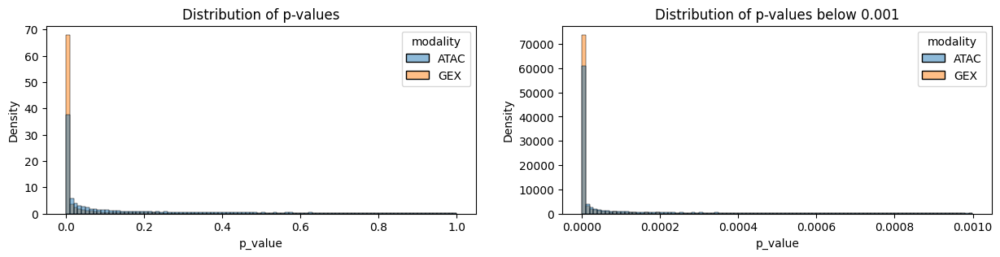

In [47]:
# plot the distribution of p-values (colored by modality)

fig, ax = plt.subplots(1, 2, figsize=(15, 3))
sns.histplot(data=gene_p_values, x='p_value', hue='modality', ax=ax[0], bins=100, common_norm=False, stat='density')
ax[0].set_title('Distribution of p-values')
alpha = 0.001
sns.histplot(data=gene_p_values[gene_p_values['p_value'] < alpha], x='p_value', hue='modality', ax=ax[1], bins=100, common_norm=False, stat='density')
ax[1].set_title(f'Distribution of p-values below {alpha}')
plt.show()

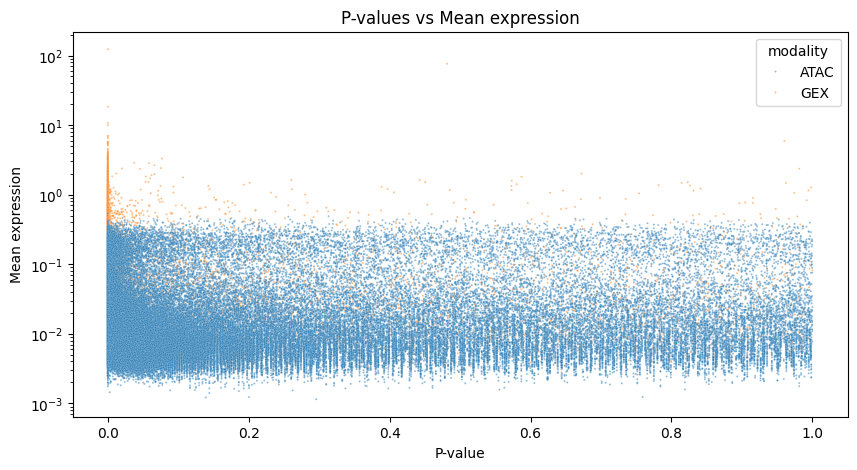

In [56]:
# plot the p_values agains the mean expression

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
sns.scatterplot(data=gene_p_values, x='p_value', y='mean', hue='modality', ax=ax, alpha=0.5, s=2)
plt.title('P-values vs Mean expression')
plt.xlabel('P-value')
plt.ylabel('Mean expression')
plt.yscale('log')
#plt.xscale('log')
plt.show()

In [69]:
print('Number of zeros in p values: ', len(np.where(gene_p_values['p_value'] == 0.0)[0]))
alphas = [1e-3, 1e-4, 1e-5, 1e-10, 1e-100, 1e-200]
for alpha in alphas:
    print(f'Number of p-values below {alpha}: ', len(np.where(gene_p_values['p_value'] < alpha)[0]))


Number of zeros in p values:  111
Number of p-values below 0.001:  37575
Number of p-values below 0.0001:  29189
Number of p-values below 1e-05:  23872
Number of p-values below 1e-10:  12035
Number of p-values below 1e-100:  1148
Number of p-values below 1e-200:  336


In [62]:
significant_genes = gene_p_values[(gene_p_values['p_value'] == 0.0) & (gene_p_values['modality'] == 'GEX')].sort_values(by='p_value')
print(significant_genes)

             gene  p_value modality      mean
500          ROR1      0.0      GEX  0.130091
11622      NIBAN3      0.0      GEX  0.199804
11141      KLHL14      0.0      GEX  0.133573
10970  AC016168.2      0.0      GEX  0.027331
10862       CD79B      0.0      GEX  0.265472
9234         IGHM      0.0      GEX  0.684090
9161        TCL1A      0.0      GEX  0.136563
8672        PCDH9      0.0      GEX  0.613923
8630       RUBCNL      0.0      GEX  0.239660
8402          HRK      0.0      GEX  0.025211
8388         DTX1      0.0      GEX  0.060191
6838    LINC01374      0.0      GEX  0.256839
6128         PAX5      0.0      GEX  0.417236
5006      RAPGEF5      0.0      GEX  0.125796
4663   AL132996.1      0.0      GEX  0.034600
4662        BACH2      0.0      GEX  3.062154
4196         IRF4      0.0      GEX  0.175397
4087         EBF1      0.0      GEX  0.921446
3380         LEF1      0.0      GEX  0.507053
2896          MME      0.0      GEX  0.192700
2414       ARPP21      0.0      GE

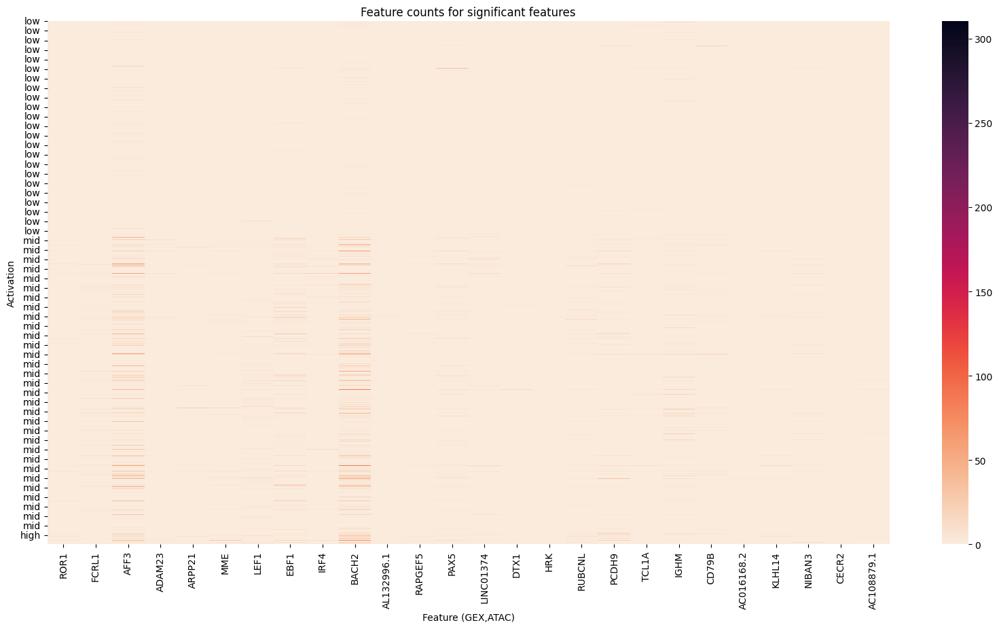

In [66]:
# plot a heatmap of all values for the significant genes

significant_gene_ids = data.var.index.isin(significant_genes['gene'].values)

data_high_low = pd.DataFrame(data.X[:, significant_gene_ids].todense(), columns=data.var.index[significant_gene_ids])
data_high_low['activation'] = 'mid'
data_high_low['activation'].values[low_ids.detach().cpu()] = 'low'
data_high_low['activation'].values[high_ids.detach().cpu()] = 'high'
data_high_low['activation'] = data_high_low['activation'].astype('category')
data_high_low['activation'] = data_high_low['activation'].cat.reorder_categories(['low', 'mid', 'high'])
data_high_low = data_high_low.sort_values(by='activation')
data_high_low.index = data_high_low['activation']
data_high_low = data_high_low.drop(columns=['activation'])

fig, ax = plt.subplots(1, 1, figsize=(20, 10))
sns.heatmap(data_high_low, cmap='rocket_r', ax=ax)
plt.title(f'Feature counts for significant features')
plt.xlabel('Feature (GEX,ATAC)')
plt.ylabel('Activation')
plt.show()

In [70]:
alpha = 1e-100
significant_genes = gene_p_values[(gene_p_values['p_value'] > 0.0) & (gene_p_values['p_value'] < alpha) & (gene_p_values['modality'] == 'GEX')].sort_values(by='p_value')
print(significant_genes)

             gene        p_value modality      mean
4688         CD24  1.899973e-290      GEX  0.066641
2715      CCDC191  5.639874e-284      GEX  0.128299
9863        ACSM3  2.393328e-278      GEX  0.449841
9162   AL139020.1  2.790018e-269      GEX  0.038658
5092        AEBP1  2.558187e-254      GEX  0.032223
...           ...            ...      ...       ...
7161         SOX6  1.356959e-104      GEX  2.260910
6210          SYK  4.167580e-104      GEX  0.869252
10582        CCL5  2.058057e-103      GEX  1.300069
8256    LINC02397  2.697172e-102      GEX  0.055637
5197         CD36  1.414792e-101      GEX  1.453068

[73 rows x 4 columns]


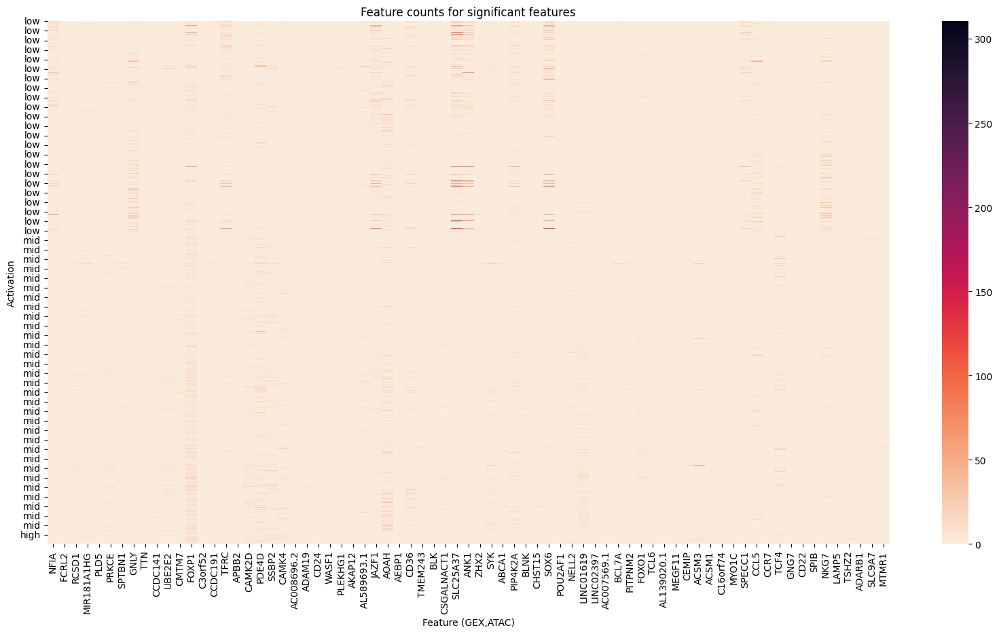

In [71]:
# plot a heatmap of all values for the significant genes

significant_gene_ids = data.var.index.isin(significant_genes['gene'].values)

data_high_low = pd.DataFrame(data.X[:, significant_gene_ids].todense(), columns=data.var.index[significant_gene_ids])
data_high_low['activation'] = 'mid'
data_high_low['activation'].values[low_ids.detach().cpu()] = 'low'
data_high_low['activation'].values[high_ids.detach().cpu()] = 'high'
data_high_low['activation'] = data_high_low['activation'].astype('category')
data_high_low['activation'] = data_high_low['activation'].cat.reorder_categories(['low', 'mid', 'high'])
data_high_low = data_high_low.sort_values(by='activation')
data_high_low.index = data_high_low['activation']
data_high_low = data_high_low.drop(columns=['activation'])

fig, ax = plt.subplots(1, 1, figsize=(20, 10))
sns.heatmap(data_high_low, cmap='rocket_r', ax=ax)
plt.title(f'Feature counts for significant features')
plt.xlabel('Feature (GEX,ATAC)')
plt.ylabel('Activation')
plt.show()